<a href="https://colab.research.google.com/github/Covpet/ENHANCING-PLANT-DISEASE-DETECTION-WITH-DEEP-LEARNING-MODELS/blob/main/plant_disease_detection_(cassava_and_maize)_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install keras-tuner --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 9.6 MB/s eta 0:00:00


### Import Important libraries from the python package

In [2]:
import os
import cv2

import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import shutil
import tensorflow as tf
from PIL import ImageFile
import keras_tuner as kt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D , Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import metrics
from tensorflow.keras.applications import MobileNetV2, ResNet50, VGG16
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50

# Mount Google drive

In [3]:
# Import and mount Google Drive.
from google.colab import drive

drive.mount("/content/drive")


Mounted at /content/drive


# DATA PREPROCESSING

# Base directory structure for maize, Clean up was done for maize due to corrupted images

Displaying images from folder: fall armyworm


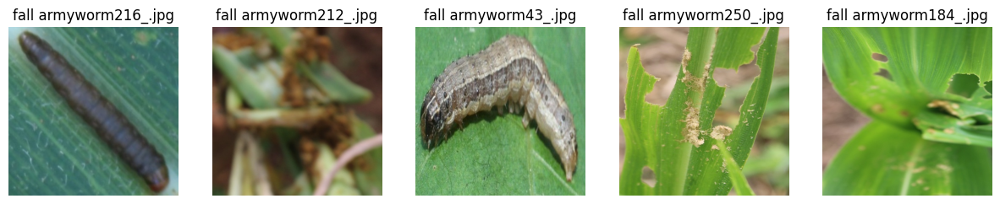

Displaying images from folder: grasshoper


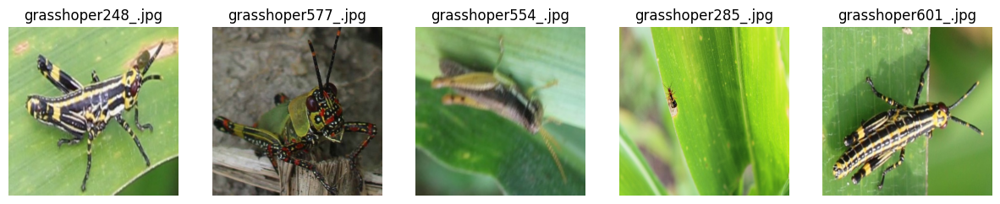

Displaying images from folder: healthy


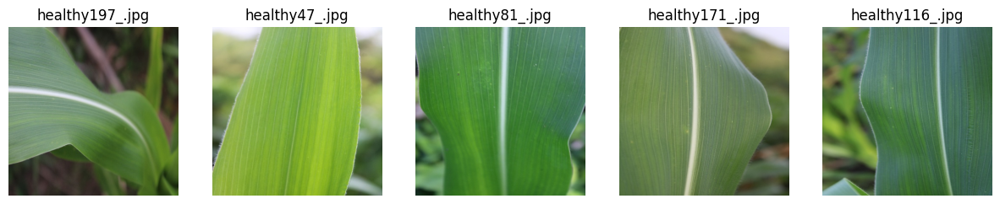

Displaying images from folder: leaf beetle


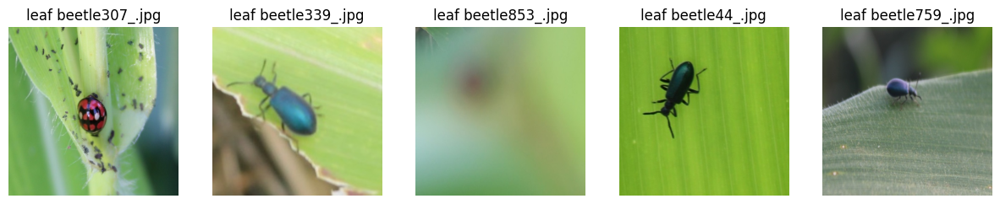

Displaying images from folder: leaf blight


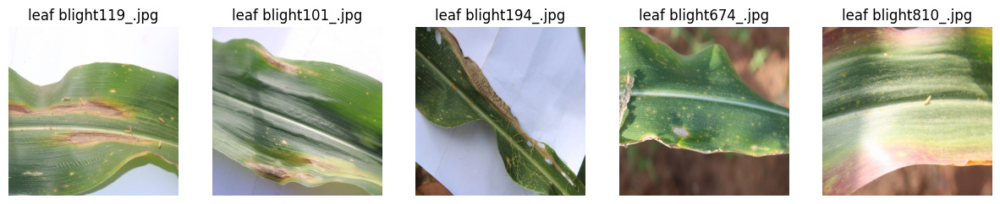

Displaying images from folder: leaf spot


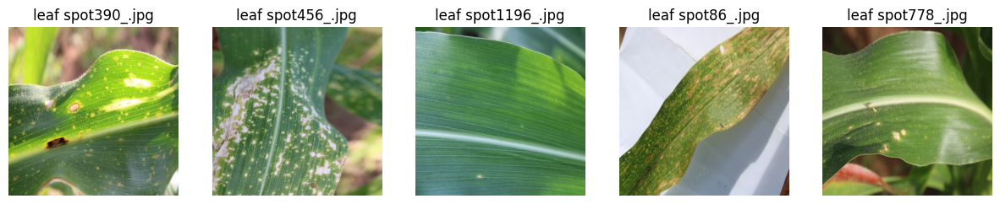

Displaying images from folder: streak virus


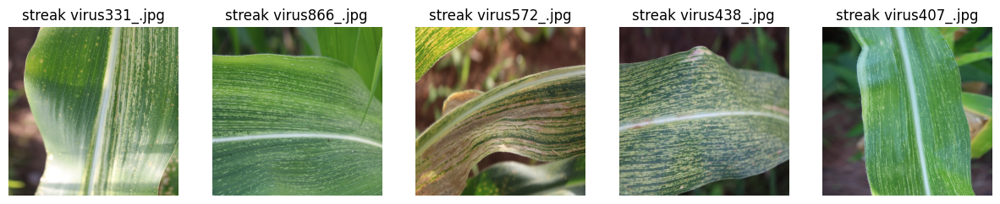

In [4]:
# Define base directory and folder names
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Function to display a sample of 5 images from each folder
def display_images_from_folders(base_dir, folders, num_images=5):
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        print(f"Displaying images from folder: {folder}")

        # Remove invalid images before displaying
        remove_invalid_images(folder_path)

        # Get all valid image files in the folder after cleanup
        files = [f for f in os.listdir(folder_path) if is_valid_image(os.path.join(folder_path, f))]

        if len(files) < num_images:
            print(f"Not enough valid images in {folder}. Found only {len(files)} valid images.")
            continue

        # Randomly select images to display
        selected_files = random.sample(files, num_images)

        # Create a subplot to display images
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

        for i, file in enumerate(selected_files):
            img_path = os.path.join(folder_path, file)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(file)

        plt.show()

# Call the function to display images and remove invalid ones
display_images_from_folders(base_dir, folders)

#  Directory structure for cassava


                                          image_path             class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight


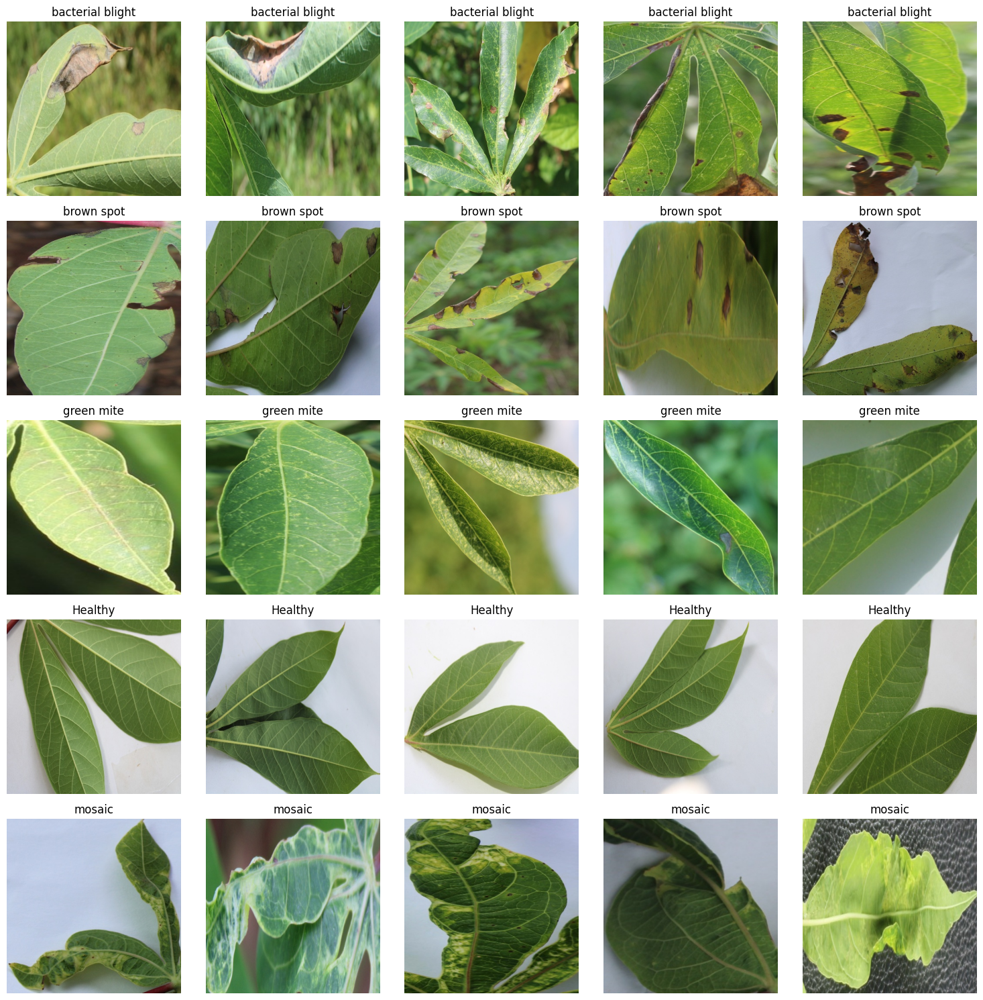

In [5]:
# Directory structure
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# List to store image paths and their corresponding classes
image_paths = []
image_classes = []

# Iterate through each folder and collect image paths
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(folder)

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'] == folder].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

# Maize and Cassava info counts

In [6]:
# Function to load and prepare the DataFrame
def load_data(base_dir, folders):
    image_paths = []
    image_classes = []

    # Iterate through each folder and collect image paths
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        for filename in os.listdir(folder_path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
                image_paths.append(os.path.join(folder_path, filename))
                image_classes.append(folder)

    # Create a DataFrame
    df_images = pd.DataFrame({
        'image_path': image_paths,
        'class': image_classes
    })

    return df_images

# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# Count the number of images per class
maize_class_counts = df_maize['class'].value_counts()
cassava_class_counts = df_cassava['class'].value_counts()

# Count the file formats for both datasets
maize_file_formats = df_maize['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
cassava_file_formats = df_cassava['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()

# Display counts for Maize
print("Maize Class Counts:")
print(maize_class_counts)
print("\nMaize File Format Counts:")
print(maize_file_formats)

# Display counts for Cassava
print("\nCassava Class Counts:")
print(cassava_class_counts)
print("\nCassava File Format Counts:")
print(cassava_file_formats)

Maize Class Counts:
class
leaf spot        1249
streak virus     1002
leaf blight       998
leaf beetle       938
grasshoper        683
fall armyworm     285
healthy           206
Name: count, dtype: int64

Maize File Format Counts:
image_path
jpg    5361
Name: count, dtype: int64

Cassava Class Counts:
class
bacterial blight    2772
brown spot          1506
Healthy             1283
mosaic              1235
green mite          1154
Name: count, dtype: int64

Cassava File Format Counts:
image_path
jpg    7950
Name: count, dtype: int64


# Exploratory data Analysis for maize and cassava

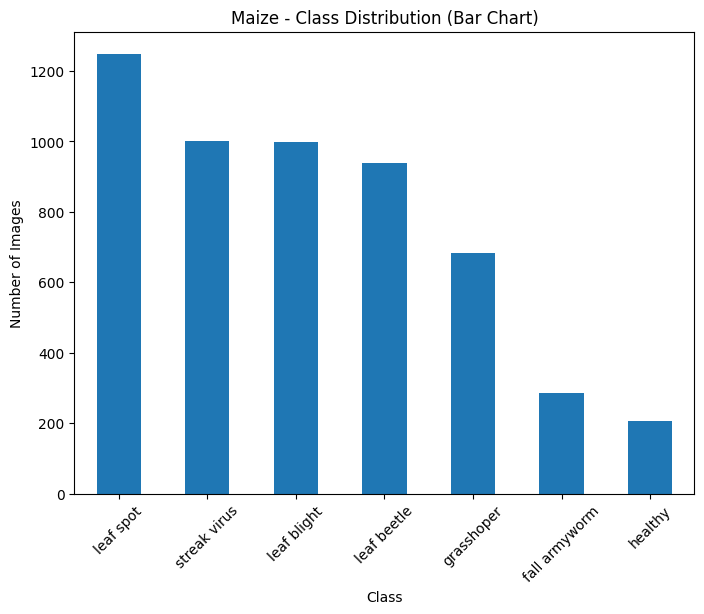

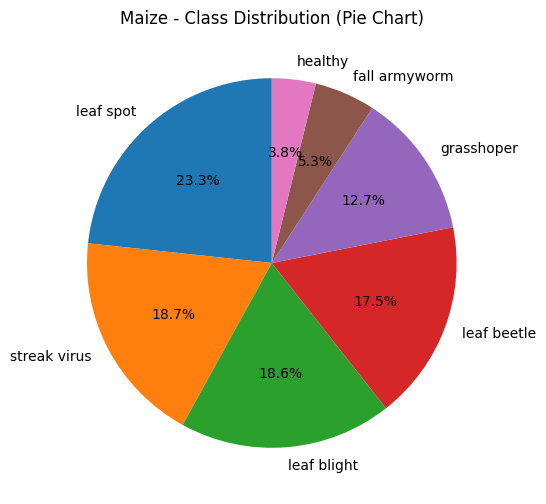

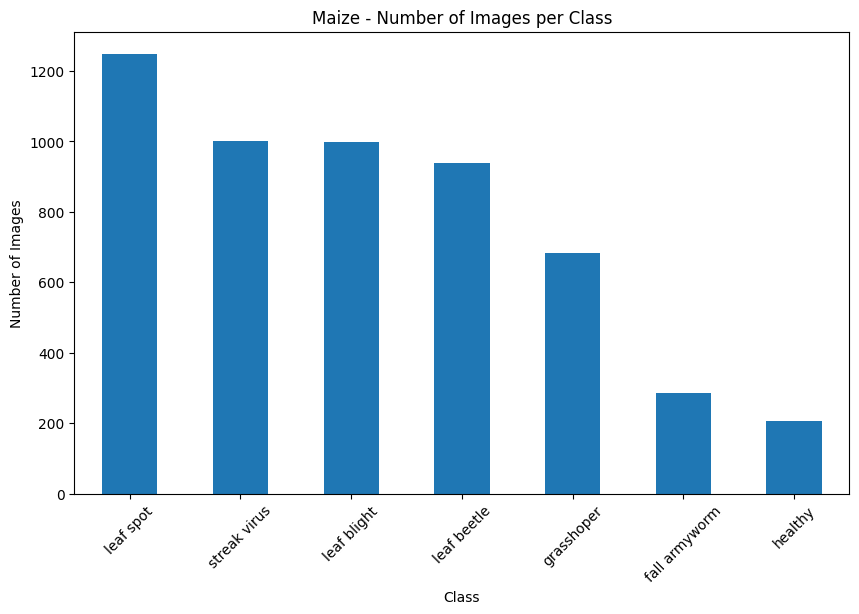

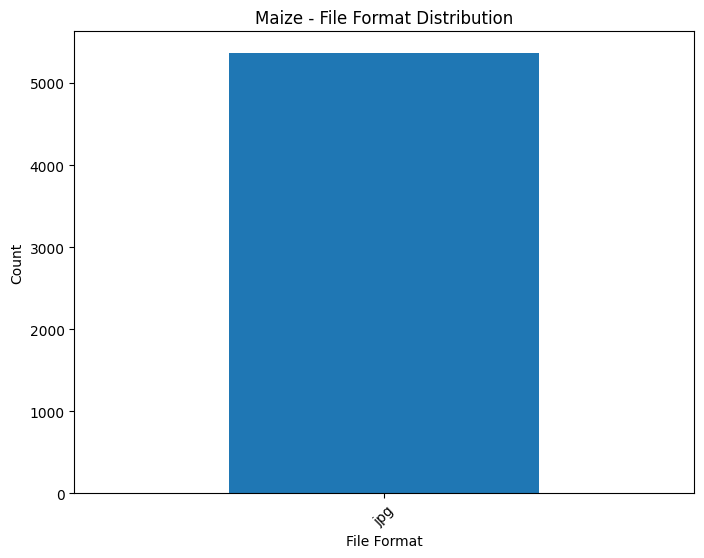

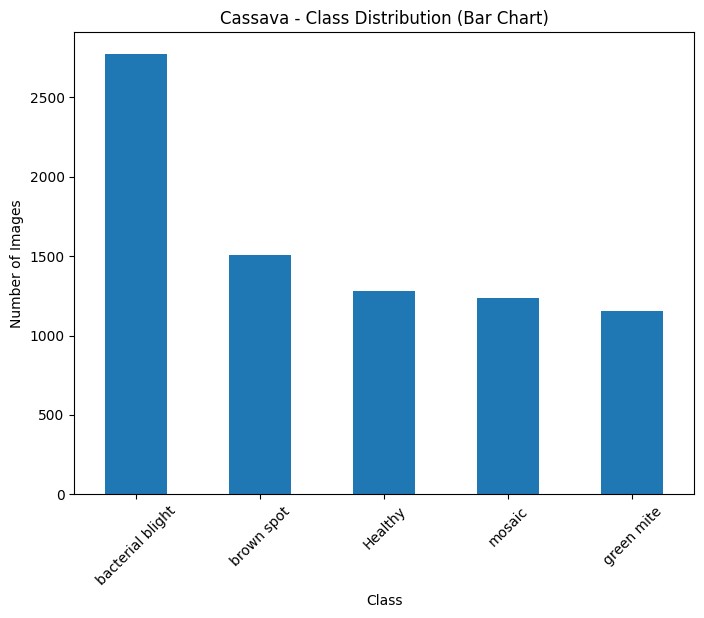

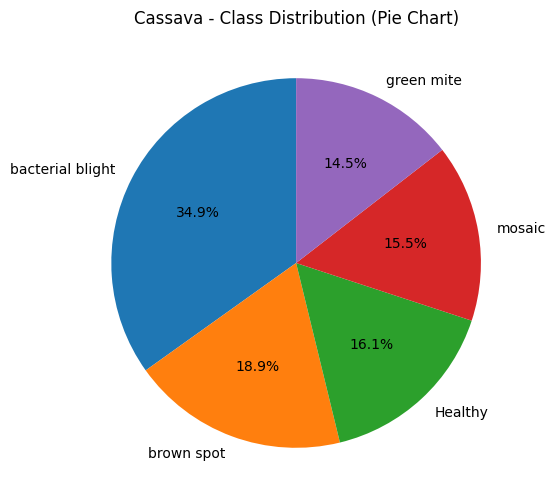

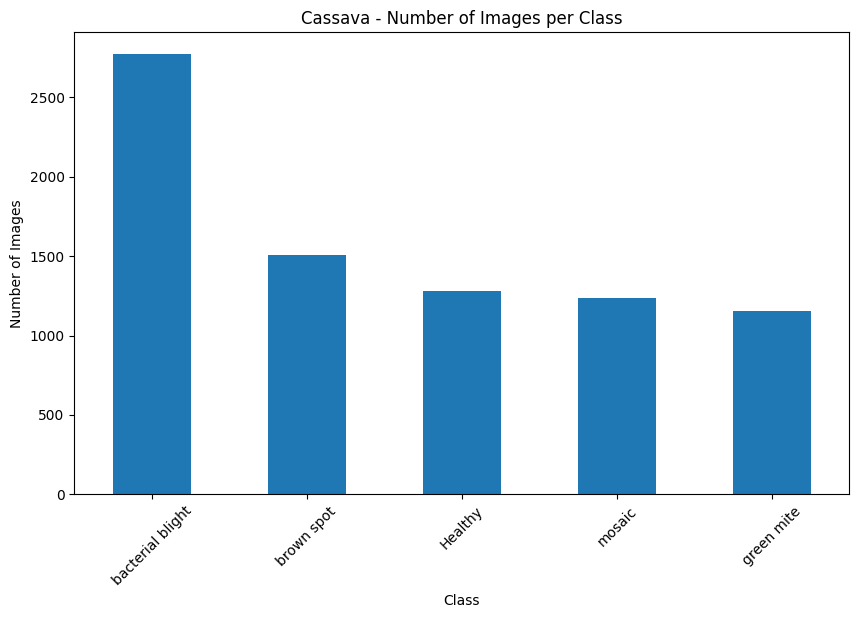

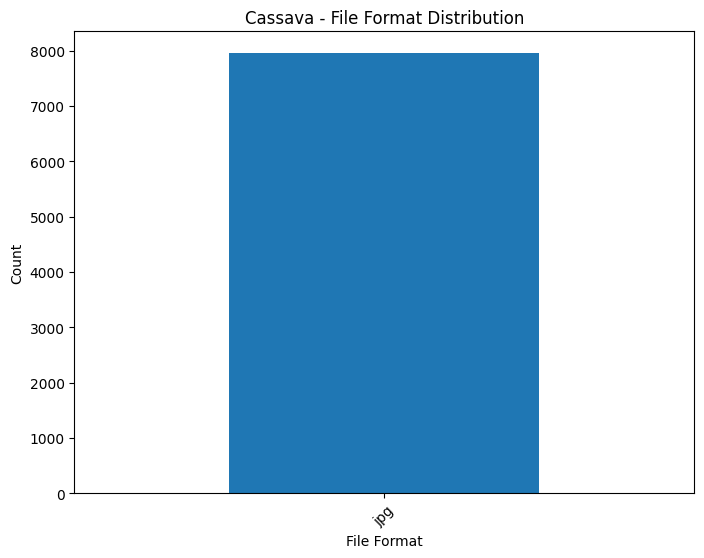

In [7]:
# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# EDA for Maize dataset and cassava
def plot_eda(df_images, title):
    # Class distribution (Bar Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='bar')
    plt.title(f'{title} - Class Distribution (Bar Chart)')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # Class distribution (Pie Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title(f'{title} - Class Distribution (Pie Chart)')
    plt.ylabel('')
    plt.show()

    # Number of Images per Class (Bar Chart)
    class_counts = df_images['class'].value_counts()
    class_counts.plot(kind='bar', figsize=(10, 6))
    plt.title(f'{title} - Number of Images per Class')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # File Format Distribution (Bar Chart)
    file_formats = df_images['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
    file_formats.plot(kind='bar', figsize=(8, 6))
    plt.title(f'{title} - File Format Distribution')
    plt.xlabel('File Format')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Plot EDA for Maize dataset
plot_eda(df_maize, 'Maize')

# Plot EDA for Cassava dataset
plot_eda(df_cassava, 'Cassava')

In [8]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Preparing Image dataset for both images and creating a data frame


                                          image_path                class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm


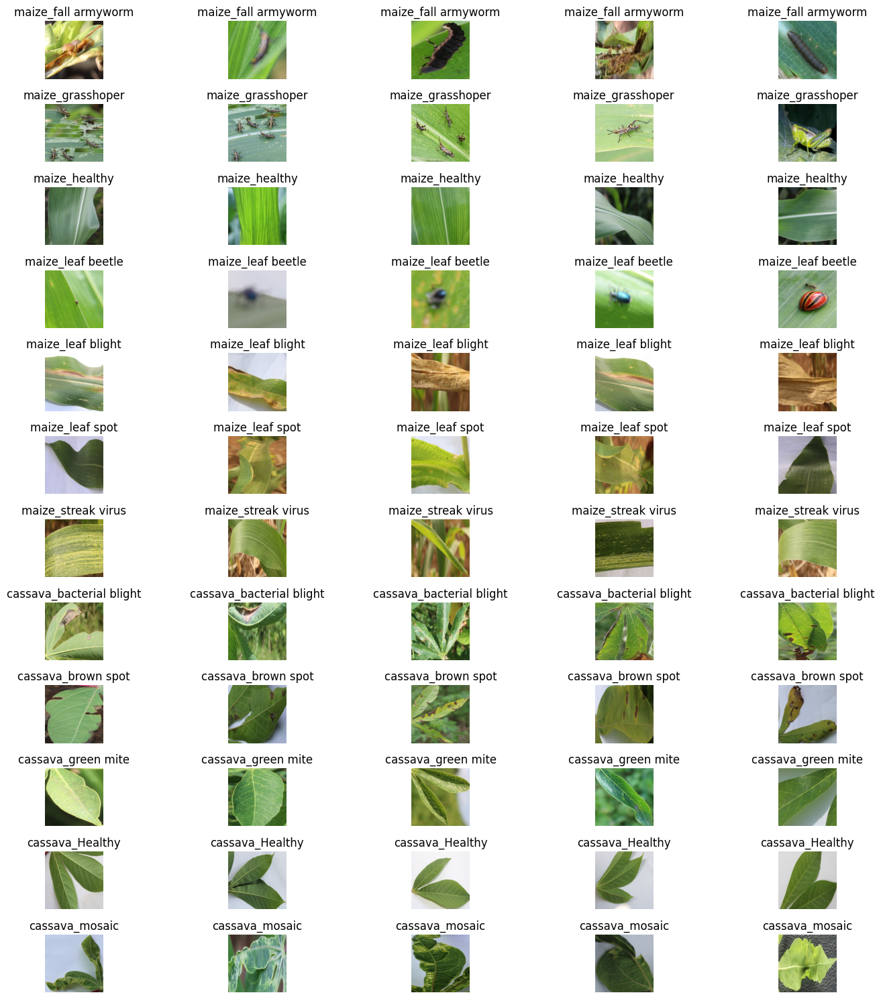

In [9]:
# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Remove invalid images before training for both datasets
for folder in maize_folders:
    remove_invalid_images(os.path.join(maize_base_dir, folder))
for folder in cassava_folders:
    remove_invalid_images(os.path.join(cassava_base_dir, folder))

# Create a DataFrame for the images in both datasets
image_paths = []
image_classes = []

# Maize dataset
for folder in maize_folders:
    folder_path = os.path.join(maize_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"maize_{folder}")

# Cassava dataset
for folder in cassava_folders:
    folder_path = os.path.join(cassava_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"cassava_{folder}")

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(maize_folders) + len(cassava_folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(maize_folders + cassava_folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'].str.contains(folder)].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

### Printing number of unique classes

In [10]:
unique_classes = df_images['class'].nunique()
print(f"Number of classes in the dataset: {unique_classes}")

Number of classes in the dataset: 12


### Combining Maize and Cassava Dataframes and creating splits into train, test and validation (80%, 10%, 10%)

In [11]:
# Combine the Maize and Cassava DataFrames
df_combined = pd.concat([df_maize, df_cassava], ignore_index=True)

# Split into training (80%), testing (10%), and validation (10%)
train_df, test_df = train_test_split(df_combined, test_size=0.2, stratify=df_combined['class'], random_state=42)
valid_df, test_df = train_test_split(test_df, test_size=0.5, stratify=test_df['class'], random_state=42)

# Display the counts for each dataset to verify
print(f"Training set: {train_df.shape[0]} images")
print(f"Validation set: {valid_df.shape[0]} images")
print(f"Testing set: {test_df.shape[0]} images")

# Optional: Check the distribution of classes in each set
print("\nTraining set class distribution:")
print(train_df['class'].value_counts())

print("\nValidation set class distribution:")
print(valid_df['class'].value_counts())

print("\nTesting set class distribution:")
print(test_df['class'].value_counts())

Training set: 10648 images
Validation set: 1331 images
Testing set: 1332 images

Training set class distribution:
class
bacterial blight    2218
brown spot          1205
Healthy             1026
leaf spot            999
mosaic               988
green mite           923
streak virus         802
leaf blight          798
leaf beetle          750
grasshoper           546
fall armyworm        228
healthy              165
Name: count, dtype: int64

Validation set class distribution:
class
bacterial blight    277
brown spot          150
Healthy             128
leaf spot           125
mosaic              123
green mite          115
streak virus        100
leaf blight         100
leaf beetle          94
grasshoper           69
fall armyworm        29
healthy              21
Name: count, dtype: int64

Testing set class distribution:
class
bacterial blight    277
brown spot          151
Healthy             129
leaf spot           125
mosaic              124
green mite          116
leaf blight    

In [12]:
!pip install keras-tuner --quiet

### Image Data Generator to load and Augment Images in Batches

In [13]:
# Data generators to load and augment images in batches
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
# Train, valid and test generator
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(dataframe=valid_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(dataframe=test_df, directory=None,
                                                  x_col='image_path', y_col='class',
                                                  target_size=(150, 150), batch_size=32,
                                                  class_mode='categorical')

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.


# Building of Models

## CNN Models (Non pre trained)

## 10 Epochs

In [ ]:
# Build the CNN Model
model= Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])
# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history = model.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.1930 - loss: 2.3644
Epoch 1: val_loss improved from inf to 1.89294, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 275ms/step - accuracy: 0.1931 - loss: 2.3641 - val_accuracy: 0.3614 - val_loss: 1.8929
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.2916 - loss: 1.9887
Epoch 2: val_loss improved from 1.89294 to 1.61454, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.2917 - loss: 1.9885 - val_accuracy: 0.4117 - val_loss: 1.6145
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.3707 - loss: 1.7525
Epoch 3: val_loss improved from 1.61454 to 1.34243, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.3708 - loss: 1.7523 - val_accuracy: 0.5101 - val_loss: 1.3424
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.4387 - loss: 1.5650
Epoch 4: val_loss did not improve from 1.34243
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.4388 - loss: 1.5649 - val_accuracy: 0.4621 - val_loss: 1.4599
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.4867 - loss: 1.4738
Epoch 5: val_loss improved from 1.34243 to 1.23935, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 273ms/step - accuracy: 0.4867 - loss: 1.4736 - val_accuracy: 0.5470 - val_loss: 1.2394
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.5175 - loss: 1.3764
Epoch 6: val_loss improved from 1.23935 to 1.05911, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.5176 - loss: 1.3764 - val_accuracy: 0.6236 - val_loss: 1.0591
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.5492 - loss: 1.2773
Epoch 7: val_loss improved from 1.05911 to 0.98786, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.5492 - loss: 1.2773 - val_accuracy: 0.6514 - val_loss: 0.9879
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.5613 - loss: 1.2449
Epoch 8: val_loss improved from 0.98786 to 0.97390, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.5613 - loss: 1.2449 - val_accuracy: 0.6582 - val_loss: 0.9739
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.5784 - loss: 1.2169
Epoch 9: val_loss improved from 0.97390 to 0.91088, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.5785 - loss: 1.2168 - val_accuracy: 0.6739 - val_loss: 0.9109
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.5975 - loss: 1.1426
Epoch 10: val_loss improved from 0.91088 to 0.87629, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.5976 - loss: 1.1426 - val_accuracy: 0.7032 - val_loss: 0.8763
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - accuracy: 0.7114 - loss: 0.8991
Test accuracy: 0.7080


## training and validation on Cnn on 10 epoch

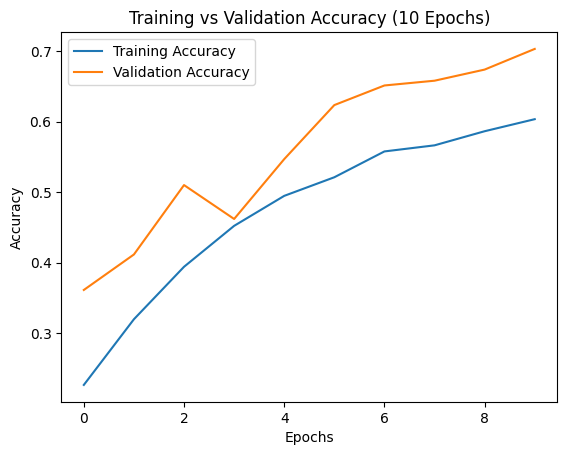

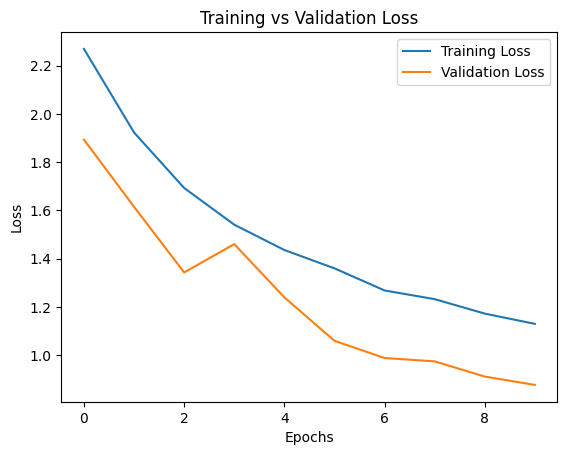

In [ ]:
# Plot the training and validation accuracy fo 10 Epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (10 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Evaluation on cnn model on 10 epoch


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━

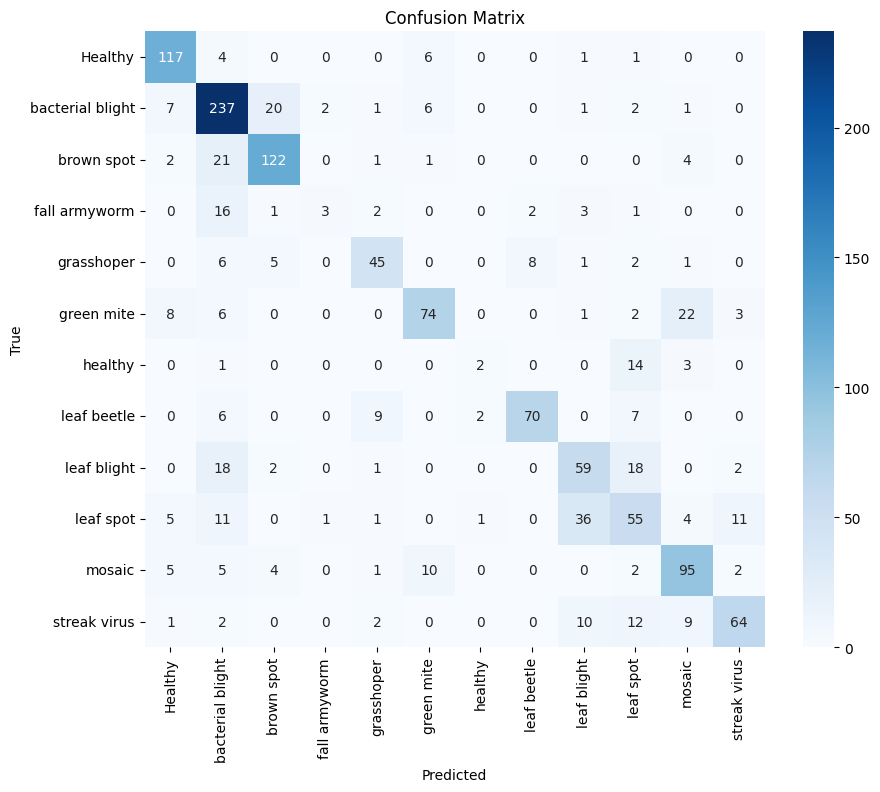

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## CNN FOR 20 EPOCHS

In [ ]:
# Train the model
history1 = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.6284 - loss: 1.0628
Epoch 1: val_loss did not improve from 0.87629
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.6284 - loss: 1.0628 - val_accuracy: 0.6604 - val_loss: 0.9541
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.6369 - loss: 1.0133
Epoch 2: val_loss improved from 0.87629 to 0.79035, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.6370 - loss: 1.0133 - val_accuracy: 0.7213 - val_loss: 0.7903
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6630 - loss: 0.9890
Epoch 3: val_loss improved from 0.79035 to 0.73975, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.6630 - loss: 0.9890 - val_accuracy: 0.7340 - val_loss: 0.7397
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.6695 - loss: 0.9516
Epoch 4: val_loss did not improve from 0.73975
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 269ms/step - accuracy: 0.6695 - loss: 0.9516 - val_accuracy: 0.7145 - val_loss: 0.8569
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.6747 - loss: 0.9276
Epoch 5: val_loss did not improve from 0.73975
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.6747 - loss: 0.9276 - val_accuracy: 0.7378 - val_loss: 0.7605
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.6760 - loss: 0.9115
Epoch 6: val_loss improved from 0.73975 to 0.69252, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 93s 278ms/step - accuracy: 0.6760 - loss: 0.9115 - val_accuracy: 0.7641 - val_loss: 0.6925
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.6972 - loss: 0.8633
Epoch 7: val_loss improved from 0.69252 to 0.62628, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.6972 - loss: 0.8633 - val_accuracy: 0.7776 - val_loss: 0.6263
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6976 - loss: 0.8425
Epoch 8: val_loss did not improve from 0.62628
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.6976 - loss: 0.8425 - val_accuracy: 0.7603 - val_loss: 0.7006
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7010 - loss: 0.8656
Epoch 9: val_loss did not improve from 0.62628
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7010 - loss: 0.8655 - val_accuracy: 0.7288 - val_loss: 0.7315
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.6966 - loss: 0.8490
Epoch 10: val_loss did not improve from 0.62628
333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.6966 - loss: 0.8489 - val_accuracy: 0.7731 - val_loss: 0.6287
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7144 - loss: 0.7992
Epoch 11: val_loss did n

333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 290ms/step - accuracy: 0.7127 - loss: 0.8059 - val_accuracy: 0.7949 - val_loss: 0.5733
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7176 - loss: 0.7893
Epoch 14: val_loss improved from 0.57334 to 0.55299, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.7176 - loss: 0.7893 - val_accuracy: 0.7911 - val_loss: 0.5530
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.7248 - loss: 0.7762
Epoch 15: val_loss did not improve from 0.55299
333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 289ms/step - accuracy: 0.7249 - loss: 0.7762 - val_accuracy: 0.8009 - val_loss: 0.5883
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7285 - loss: 0.7776
Epoch 16: val_loss did not improve from 0.55299
333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.7285 - loss: 0.7775 - val_accuracy: 0.7986 - val_loss: 0.5812
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.7432 - loss: 0.7277
Epoch 17: val_loss did not improve from 0.55299
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 285ms/step - accuracy: 0.7432 - loss: 0.7277 - val_accuracy: 0.7799 - val_loss: 0.6300
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7483 - loss: 0.7109
Epoch 18: val_loss i

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7483 - loss: 0.7110 - val_accuracy: 0.7971 - val_loss: 0.5455
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.7423 - loss: 0.7117
Epoch 19: val_loss improved from 0.54546 to 0.53408, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 273ms/step - accuracy: 0.7423 - loss: 0.7117 - val_accuracy: 0.7971 - val_loss: 0.5341
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7468 - loss: 0.7206
Epoch 20: val_loss did not improve from 0.53408
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7468 - loss: 0.7206 - val_accuracy: 0.7934 - val_loss: 0.5942
42/42 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.7936 - loss: 0.5435
Test accuracy: 0.7883


## training and validation accuracy and loss of cnn on 20 epoch

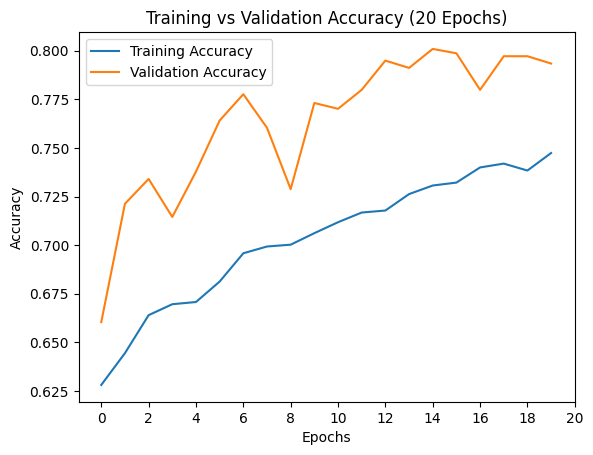

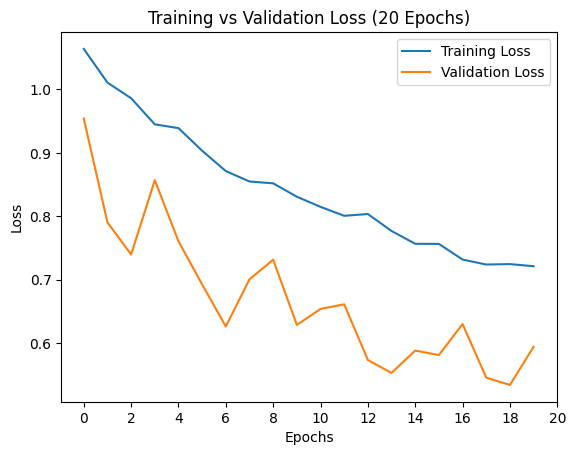

In [ ]:
# Plot the training and validation accuracy for 20 epochs
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Set x-axis ticks
plt.xticks(np.arange(0, 21, 2))  # Generates ticks at 0, 2, 4, ..., 20

plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(np.arange(0, 21, 2))
plt.legend()
plt.show()

 ## evaluation of cnn model on 20 epoch

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

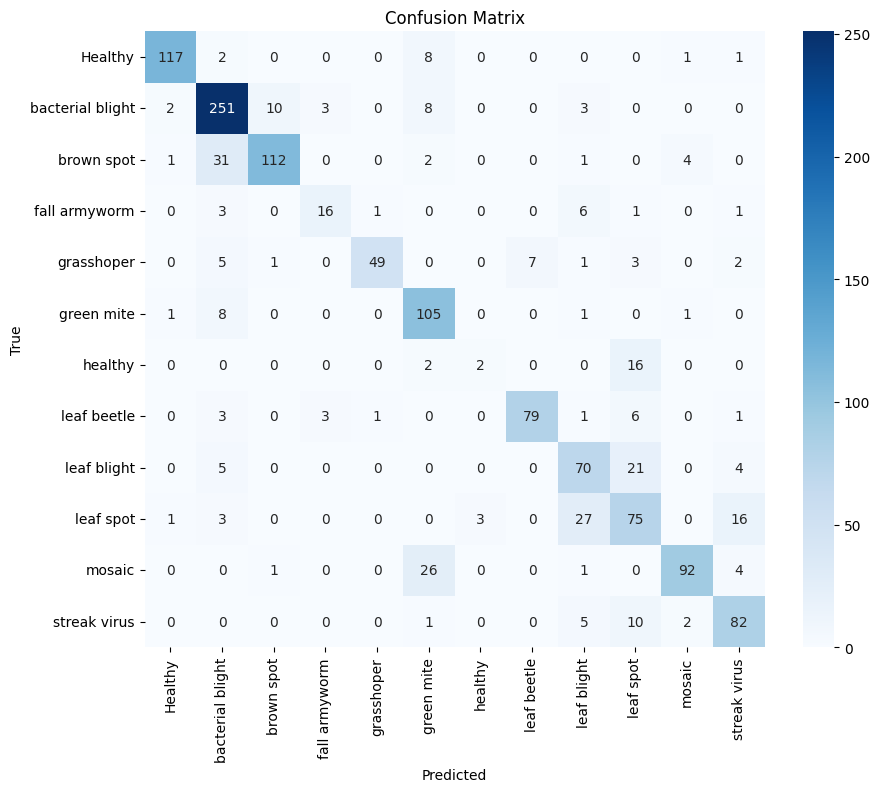

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## CNN model on 30 epoch

In [ ]:
# Train the model
history2 = model.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7522 - loss: 0.7200
Epoch 1: val_loss did not improve from 0.53408
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.7522 - loss: 0.7200 - val_accuracy: 0.8054 - val_loss: 0.6023
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7452 - loss: 0.7278
Epoch 2: val_loss did not improve from 0.53408
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7453 - loss: 0.7278 - val_accuracy: 0.8174 - val_loss: 0.5529
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7591 - loss: 0.6812
Epoch 3: val_loss improved from 0.53408 to 0.53098, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7591 - loss: 0.6812 - val_accuracy: 0.8129 - val_loss: 0.5310
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7607 - loss: 0.6637
Epoch 4: val_loss improved from 0.53098 to 0.49825, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.7607 - loss: 0.6638 - val_accuracy: 0.8077 - val_loss: 0.4983
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7579 - loss: 0.6692
Epoch 5: val_loss did not improve from 0.49825
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7579 - loss: 0.6692 - val_accuracy: 0.7956 - val_loss: 0.5284
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7572 - loss: 0.6894
Epoch 6: val_loss did not improve from 0.49825
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7572 - loss: 0.6893 - val_accuracy: 0.8219 - val_loss: 0.5361
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7765 - loss: 0.6426
Epoch 7: val_loss improved from 0.49825 to 0.49751, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7765 - loss: 0.6427 - val_accuracy: 0.8167 - val_loss: 0.4975
Epoch 8/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7712 - loss: 0.6420
Epoch 8: val_loss did not improve from 0.49751
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 268ms/step - accuracy: 0.7712 - loss: 0.6420 - val_accuracy: 0.8099 - val_loss: 0.5132
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7697 - loss: 0.6390
Epoch 9: val_loss did not improve from 0.49751
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.7697 - loss: 0.6390 - val_accuracy: 0.8159 - val_loss: 0.5209
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7702 - loss: 0.6354
Epoch 10: val_loss improved from 0.49751 to 0.47545, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7702 - loss: 0.6354 - val_accuracy: 0.8219 - val_loss: 0.4755
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.7704 - loss: 0.6406
Epoch 11: val_loss did not improve from 0.47545
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 272ms/step - accuracy: 0.7704 - loss: 0.6406 - val_accuracy: 0.8167 - val_loss: 0.5017
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7699 - loss: 0.6462
Epoch 12: val_loss did not improve from 0.47545
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7699 - loss: 0.6462 - val_accuracy: 0.7934 - val_loss: 0.5625
Epoch 13/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7710 - loss: 0.6353
Epoch 13: val_loss did not improve from 0.47545
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7709 - loss: 0.6353 - val_accuracy: 0.8084 - val_loss: 0.5917
Epoch 14/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.7777 - loss: 0.6156
Epoch 14: val_loss d

333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.7891 - loss: 0.5904 - val_accuracy: 0.8279 - val_loss: 0.4613
Epoch 18/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.7831 - loss: 0.6060
Epoch 18: val_loss did not improve from 0.46133
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 285ms/step - accuracy: 0.7831 - loss: 0.6060 - val_accuracy: 0.8287 - val_loss: 0.4717
Epoch 19/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.7821 - loss: 0.6018
Epoch 19: val_loss did not improve from 0.46133
333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 283ms/step - accuracy: 0.7821 - loss: 0.6018 - val_accuracy: 0.8077 - val_loss: 0.5505
Epoch 20/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.7828 - loss: 0.5966
Epoch 20: val_loss improved from 0.46133 to 0.44659, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 284ms/step - accuracy: 0.7828 - loss: 0.5966 - val_accuracy: 0.8370 - val_loss: 0.4466
Epoch 21/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7850 - loss: 0.5978
Epoch 21: val_loss did not improve from 0.44659
333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 287ms/step - accuracy: 0.7850 - loss: 0.5979 - val_accuracy: 0.8234 - val_loss: 0.5919
Epoch 22/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7864 - loss: 0.6130
Epoch 22: val_loss did not improve from 0.44659
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.7865 - loss: 0.6130 - val_accuracy: 0.8279 - val_loss: 0.5007
Epoch 23/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7882 - loss: 0.5704
Epoch 23: val_loss improved from 0.44659 to 0.42930, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.7882 - loss: 0.5704 - val_accuracy: 0.8482 - val_loss: 0.4293
Epoch 24/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.7885 - loss: 0.6001
Epoch 24: val_loss did not improve from 0.42930
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 287ms/step - accuracy: 0.7885 - loss: 0.6001 - val_accuracy: 0.8317 - val_loss: 0.4959
Epoch 25/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.7945 - loss: 0.5754
Epoch 25: val_loss did not improve from 0.42930
333/333 ━━━━━━━━━━━━━━━━━━━━ 93s 280ms/step - accuracy: 0.7944 - loss: 0.5754 - val_accuracy: 0.8279 - val_loss: 0.5207
Epoch 26/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.7867 - loss: 0.6004
Epoch 26: val_loss did not improve from 0.42930
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 284ms/step - accuracy: 0.7867 - loss: 0.6004 - val_accuracy: 0.8422 - val_loss: 0.4442
Epoch 27/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.8013 - loss: 0.5757
Epoch 27: val_loss d

## training and validation accuracy and loss of cnn on 30 epoch

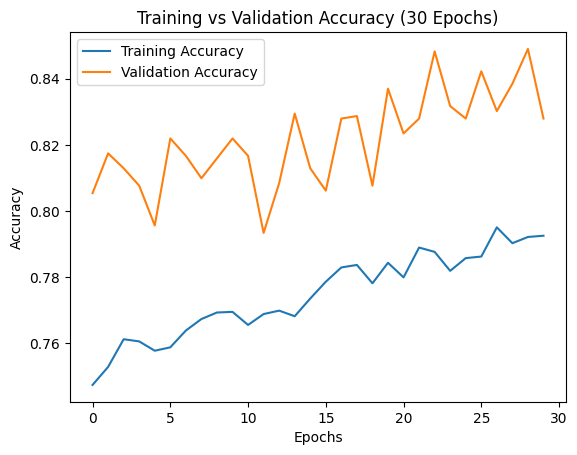

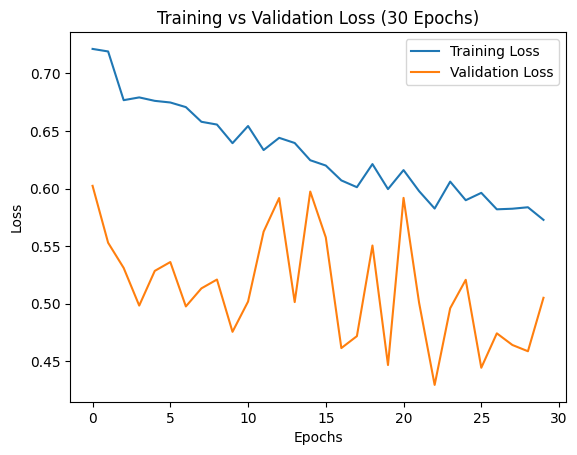

In [ ]:
# Plot the training and validation accuracy for 30 epochs
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss for 30 epochs
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## evaluation of cnn model on 30 epoch

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━

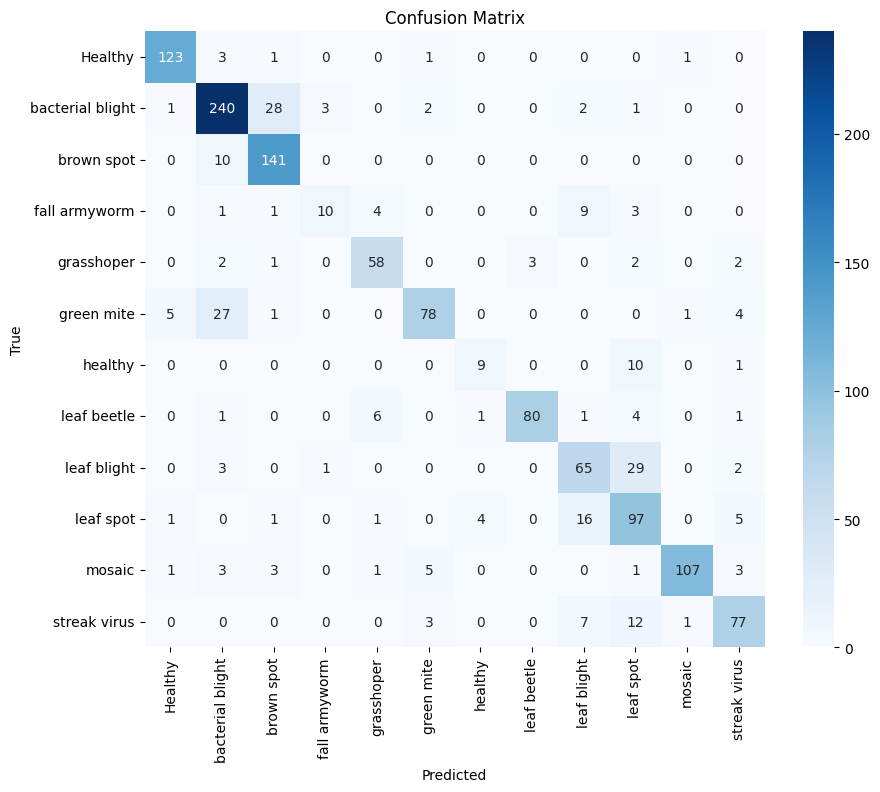

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Algorithm comparison for 3 CNN Epoch models

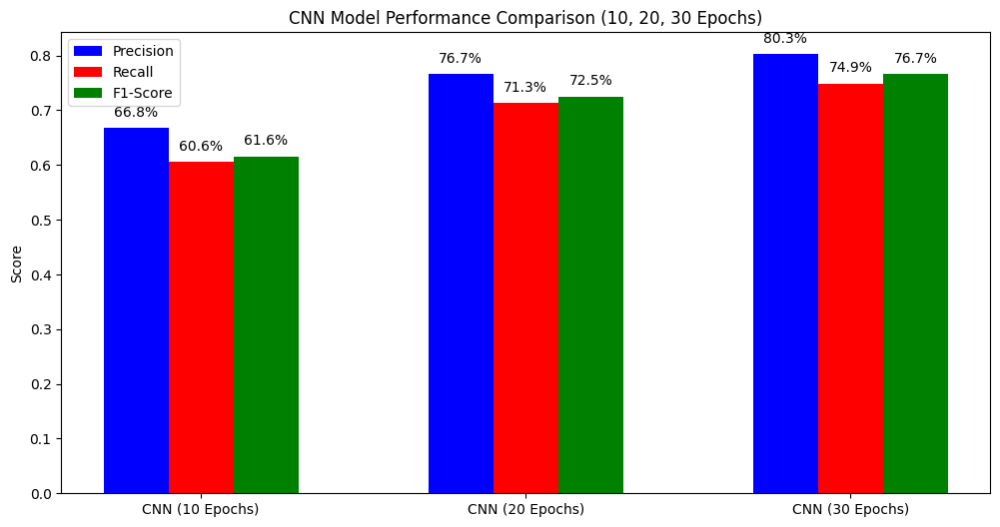

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data for CNN (10 epochs)
cnn_10_precision = [0.81, 0.71, 0.79, 0.50, 0.71, 0.76, 0.40, 0.88, 0.53, 0.47, 0.68, 0.78]
cnn_10_recall = [0.91, 0.86, 0.81, 0.11, 0.66, 0.64, 0.10, 0.74, 0.59, 0.44, 0.77, 0.64]
cnn_10_f1 = [0.85, 0.78, 0.80, 0.18, 0.69, 0.69, 0.16, 0.80, 0.56, 0.46, 0.72, 0.70]

# Data for CNN (20 epochs)
cnn_20_precision = [0.96, 0.81, 0.90, 0.73, 0.96, 0.69, 0.40, 0.92, 0.60, 0.57, 0.92, 0.74]
cnn_20_recall = [0.91, 0.91, 0.74, 0.57, 0.72, 0.91, 0.10, 0.84, 0.70, 0.60, 0.74, 0.82]
cnn_20_f1 = [0.93, 0.85, 0.81, 0.64, 0.82, 0.78, 0.16, 0.88, 0.65, 0.58, 0.82, 0.78]

# Data for CNN (30 epochs)
cnn_30_precision = [0.94, 0.83, 0.80, 0.71, 0.83, 0.88, 0.64, 0.96, 0.65, 0.61, 0.97, 0.81]
cnn_30_recall = [0.95, 0.87, 0.93, 0.36, 0.85, 0.67, 0.45, 0.85, 0.65, 0.78, 0.86, 0.77]
cnn_30_f1 = [0.95, 0.85, 0.86, 0.48, 0.84, 0.76, 0.53, 0.90, 0.65, 0.68, 0.91, 0.79]

# Calculating the mean for each metric (precision, recall, f1) for each epoch
def calculate_mean(values):
    return np.mean(values)

cnn_10_precision_mean = calculate_mean(cnn_10_precision)
cnn_10_recall_mean = calculate_mean(cnn_10_recall)
cnn_10_f1_mean = calculate_mean(cnn_10_f1)

cnn_20_precision_mean = calculate_mean(cnn_20_precision)
cnn_20_recall_mean = calculate_mean(cnn_20_recall)
cnn_20_f1_mean = calculate_mean(cnn_20_f1)

cnn_30_precision_mean = calculate_mean(cnn_30_precision)
cnn_30_recall_mean = calculate_mean(cnn_30_recall)
cnn_30_f1_mean = calculate_mean(cnn_30_f1)

# Data for plotting
epochs = ['CNN (10 Epochs)', 'CNN (20 Epochs)', 'CNN (30 Epochs)']
precision_values = [cnn_10_precision_mean, cnn_20_precision_mean, cnn_30_precision_mean]
recall_values = [cnn_10_recall_mean, cnn_20_recall_mean, cnn_30_recall_mean]
f1_values = [cnn_10_f1_mean, cnn_20_f1_mean, cnn_30_f1_mean]

# Bar width and positions
x = np.arange(len(epochs))
width = 0.2

# Color List for Bar Charts using Hex color codes
precision_color = 'blue'  # Blue
recall_color = 'red'     # Pink
f1_color = 'green'         # Green

# Plotting the histogram
fig, ax = plt.subplots(figsize=(12, 6))
bars_precision = ax.bar(x - width, precision_values, width, label='Precision', color=precision_color)
bars_recall = ax.bar(x, recall_values, width, label='Recall', color=recall_color)
bars_f1 = ax.bar(x + width, f1_values, width, label='F1-Score', color=f1_color)

# Labels and formatting
ax.set_xticks(x)
ax.set_xticklabels(epochs)
ax.set_ylabel('Score')
ax.set_title('CNN Model Performance Comparison (10, 20, 30 Epochs)')
ax.legend()

# Annotating the bars with the percentage values
def add_percentages(bars, values, offset=6):
    for bar, value in zip(bars, values):
        height = bar.get_height()
        ax.annotate(f'{height*100:.1f}%',  # Format as percentage
                    xy=(bar.get_x() + bar.get_width() / 2, height),  # Position of the label
                    xytext=(0, offset),  # Adjust the offset
                    textcoords="offset points",
                    ha='center', va='bottom', color='black')

# Add percentage annotations with a slight offset to avoid overlap
add_percentages(bars_precision, precision_values, offset=6)
add_percentages(bars_recall, recall_values, offset=6)
add_percentages(bars_f1, f1_values, offset=6)

# Show the plot
plt.show()

# VGG16 on 10 epochs using early stopping techniques


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history1 = VGG16_model1.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.3637 - loss: 1.8604
Epoch 1: val_loss improved from inf to 1.05305, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 102s 297ms/step - accuracy: 0.3640 - loss: 1.8596 - val_accuracy: 0.6379 - val_loss: 1.0530
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.5714 - loss: 1.2187
Epoch 2: val_loss improved from 1.05305 to 0.92521, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 281ms/step - accuracy: 0.5715 - loss: 1.2186 - val_accuracy: 0.6724 - val_loss: 0.9252
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.6171 - loss: 1.0795
Epoch 3: val_loss improved from 0.92521 to 0.89184, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 281ms/step - accuracy: 0.6171 - loss: 1.0795 - val_accuracy: 0.6897 - val_loss: 0.8918
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.6380 - loss: 1.0138
Epoch 4: val_loss improved from 0.89184 to 0.87173, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 287ms/step - accuracy: 0.6380 - loss: 1.0139 - val_accuracy: 0.6762 - val_loss: 0.8717
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6464 - loss: 0.9929
Epoch 5: val_loss improved from 0.87173 to 0.81995, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 285ms/step - accuracy: 0.6464 - loss: 0.9929 - val_accuracy: 0.7070 - val_loss: 0.8199
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.6471 - loss: 0.9679
Epoch 6: val_loss improved from 0.81995 to 0.79990, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 284ms/step - accuracy: 0.6471 - loss: 0.9679 - val_accuracy: 0.7062 - val_loss: 0.7999
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.6640 - loss: 0.9415
Epoch 7: val_loss improved from 0.79990 to 0.76395, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 284ms/step - accuracy: 0.6640 - loss: 0.9415 - val_accuracy: 0.7130 - val_loss: 0.7639
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.6739 - loss: 0.9171
Epoch 8: val_loss did not improve from 0.76395
333/333 ━━━━━━━━━━━━━━━━━━━━ 93s 279ms/step - accuracy: 0.6739 - loss: 0.9171 - val_accuracy: 0.7153 - val_loss: 0.7846
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6782 - loss: 0.8880
Epoch 9: val_loss improved from 0.76395 to 0.75315, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 285ms/step - accuracy: 0.6782 - loss: 0.8880 - val_accuracy: 0.7183 - val_loss: 0.7531
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6779 - loss: 0.8864
Epoch 10: val_loss improved from 0.75315 to 0.73351, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 284ms/step - accuracy: 0.6779 - loss: 0.8864 - val_accuracy: 0.7415 - val_loss: 0.7335
Restoring model weights from the end of the best epoch: 10.
42/42 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - accuracy: 0.7140 - loss: 0.7641
Test accuracy: 0.7057


## Training and Validation Accuracy and Loss 10 Epochs

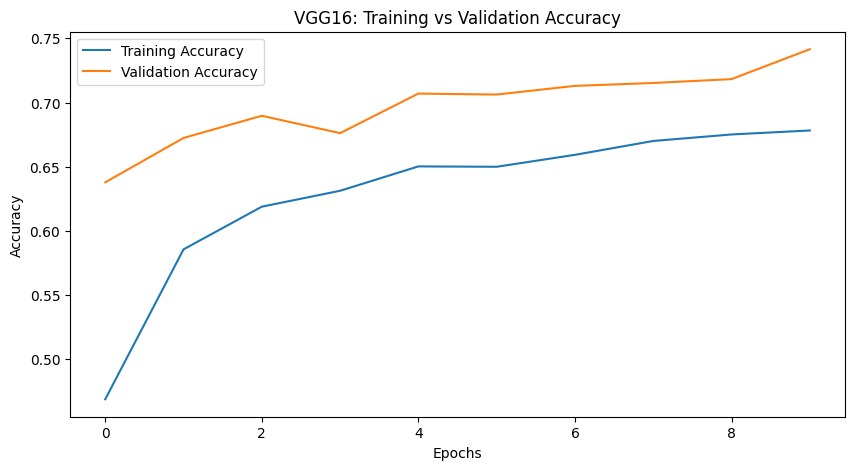

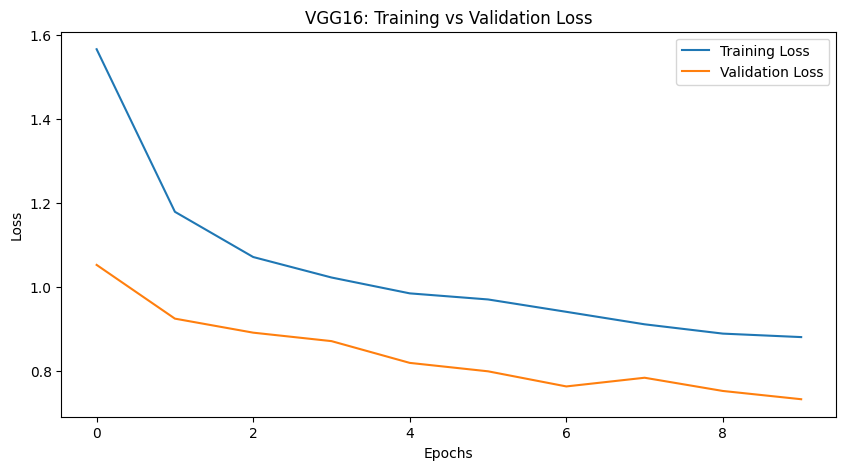

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('VGG16: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['loss'], label='Training Loss')
plt.plot(VGG16_history1.history['val_loss'], label='Validation Loss')
plt.title('VGG16: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for 10 epochs VGG16

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━

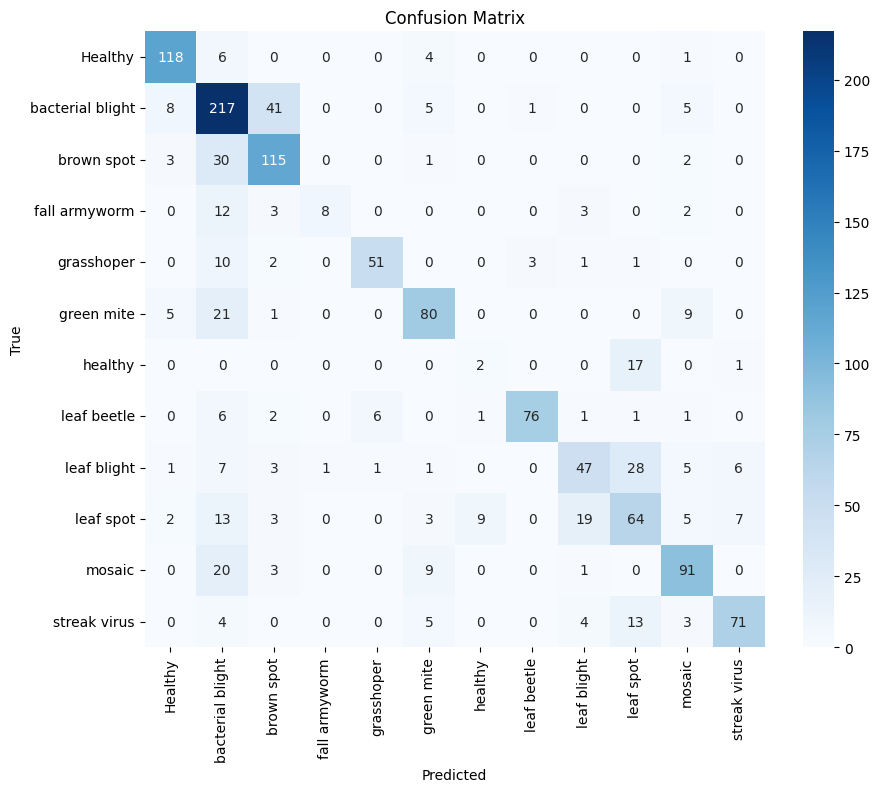

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## VGG16 on 20 epochs using early stopping techniques

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history2 = VGG16_model1.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.3798 - loss: 1.8373
Epoch 1: val_loss improved from inf to 1.05277, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 103s 299ms/step - accuracy: 0.3801 - loss: 1.8364 - val_accuracy: 0.6416 - val_loss: 1.0528
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.5778 - loss: 1.1994
Epoch 2: val_loss improved from 1.05277 to 0.91222, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 289ms/step - accuracy: 0.5778 - loss: 1.1993 - val_accuracy: 0.6860 - val_loss: 0.9122
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.6220 - loss: 1.0778
Epoch 3: val_loss improved from 0.91222 to 0.84470, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 283ms/step - accuracy: 0.6220 - loss: 1.0778 - val_accuracy: 0.6980 - val_loss: 0.8447
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.6310 - loss: 1.0287
Epoch 4: val_loss improved from 0.84470 to 0.82493, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.6310 - loss: 1.0287 - val_accuracy: 0.7055 - val_loss: 0.8249
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.6465 - loss: 0.9708
Epoch 5: val_loss improved from 0.82493 to 0.77345, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 283ms/step - accuracy: 0.6465 - loss: 0.9708 - val_accuracy: 0.7160 - val_loss: 0.7735
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.6567 - loss: 0.9706
Epoch 6: val_loss improved from 0.77345 to 0.76238, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.6567 - loss: 0.9706 - val_accuracy: 0.7205 - val_loss: 0.7624
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.6625 - loss: 0.9262
Epoch 7: val_loss improved from 0.76238 to 0.74495, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 287ms/step - accuracy: 0.6625 - loss: 0.9263 - val_accuracy: 0.7378 - val_loss: 0.7449
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.6548 - loss: 0.9285
Epoch 8: val_loss did not improve from 0.74495
333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 283ms/step - accuracy: 0.6548 - loss: 0.9284 - val_accuracy: 0.7295 - val_loss: 0.7467
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.6704 - loss: 0.9053
Epoch 9: val_loss did not improve from 0.74495
333/333 ━━━━━━━━━━━━━━━━━━━━ 97s 290ms/step - accuracy: 0.6704 - loss: 0.9053 - val_accuracy: 0.7220 - val_loss: 0.7543
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6750 - loss: 0.8859
Epoch 10: val_loss improved from 0.74495 to 0.73289, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 284ms/step - accuracy: 0.6750 - loss: 0.8859 - val_accuracy: 0.7340 - val_loss: 0.7329
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.6757 - loss: 0.8764
Epoch 11: val_loss did not improve from 0.73289
333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 281ms/step - accuracy: 0.6757 - loss: 0.8764 - val_accuracy: 0.7213 - val_loss: 0.7639
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6832 - loss: 0.8568
Epoch 12: val_loss improved from 0.73289 to 0.71781, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.6832 - loss: 0.8568 - val_accuracy: 0.7355 - val_loss: 0.7178
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.6891 - loss: 0.8500
Epoch 13: val_loss improved from 0.71781 to 0.69815, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.6891 - loss: 0.8501 - val_accuracy: 0.7393 - val_loss: 0.6981
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.6870 - loss: 0.8599
Epoch 14: val_loss did not improve from 0.69815
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 285ms/step - accuracy: 0.6870 - loss: 0.8599 - val_accuracy: 0.7438 - val_loss: 0.7168
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.6923 - loss: 0.8313
Epoch 15: val_loss did not improve from 0.69815
333/333 ━━━━━━━━━━━━━━━━━━━━ 97s 290ms/step - accuracy: 0.6923 - loss: 0.8313 - val_accuracy: 0.7543 - val_loss: 0.7009
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.6945 - loss: 0.8298
Epoch 16: val_loss improved from 0.69815 to 0.69279, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.6945 - loss: 0.8298 - val_accuracy: 0.7513 - val_loss: 0.6928
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.6986 - loss: 0.8253
Epoch 17: val_loss improved from 0.69279 to 0.68661, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 96s 288ms/step - accuracy: 0.6986 - loss: 0.8253 - val_accuracy: 0.7415 - val_loss: 0.6866
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.6925 - loss: 0.8287
Epoch 18: val_loss did not improve from 0.68661
333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.6926 - loss: 0.8287 - val_accuracy: 0.7446 - val_loss: 0.6873
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.7030 - loss: 0.8211
Epoch 19: val_loss improved from 0.68661 to 0.67806, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 95s 286ms/step - accuracy: 0.7030 - loss: 0.8211 - val_accuracy: 0.7476 - val_loss: 0.6781
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.6938 - loss: 0.8100
Epoch 20: val_loss did not improve from 0.67806
333/333 ━━━━━━━━━━━━━━━━━━━━ 94s 283ms/step - accuracy: 0.6938 - loss: 0.8100 - val_accuracy: 0.7431 - val_loss: 0.6990
Restoring model weights from the end of the best epoch: 19.
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 135ms/step - accuracy: 0.7096 - loss: 0.7441
Test accuracy: 0.7275


## Training and validation accuracy and loss on 20 epochs

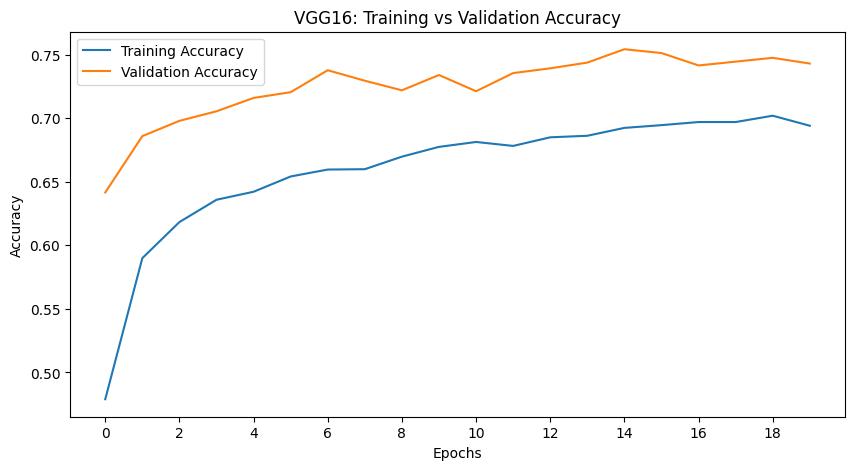

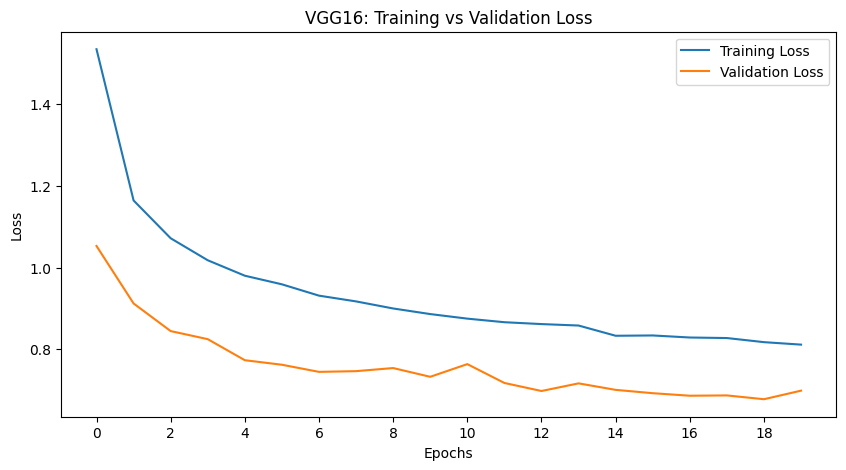

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('VGG16: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Set x-axis ticks
plt.xticks(np.arange(0, 20, 2))  # Generates ticks at 0, 2, 4, ..., 20
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['loss'], label='Training Loss')
plt.plot(VGG16_history2.history['val_loss'], label='Validation Loss')
plt.title('VGG16: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
# Set x-axis ticks
plt.xticks(np.arange(0, 20, 2))  # Generates ticks at 0, 2, 4, ..., 20
plt.legend()
plt.show()

##  Model evaluation VGG16 on 20 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━

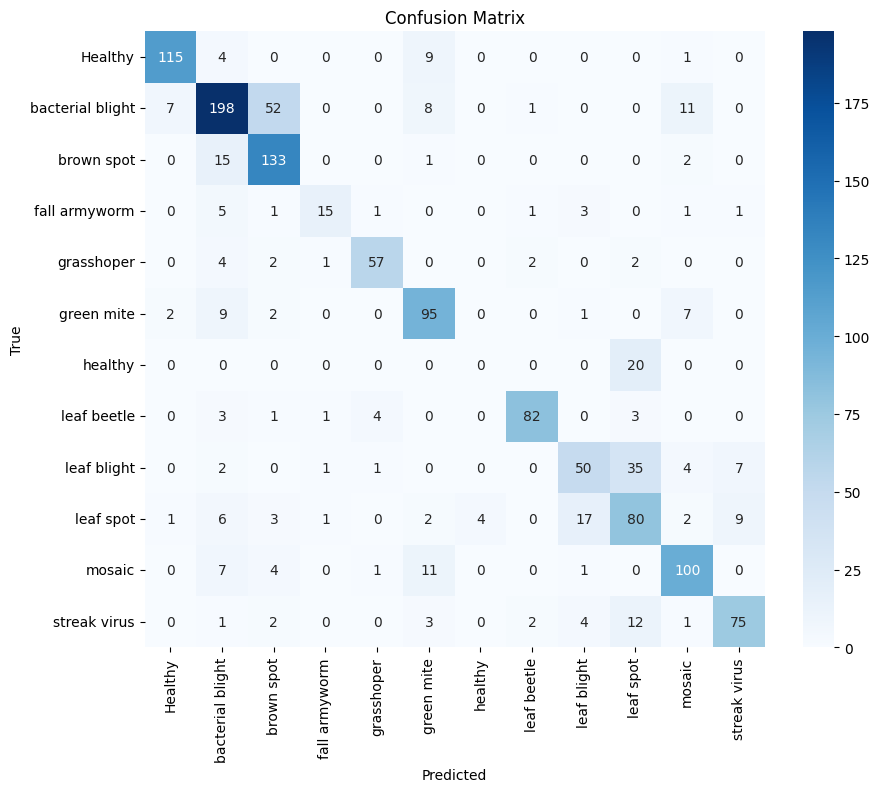

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## VGG16 on 30 epochs using early stopping techniques

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history3 = VGG16_model1.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.3857 - loss: 1.7881
Epoch 1: val_loss improved from inf to 1.03373, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 107s 300ms/step - accuracy: 0.3860 - loss: 1.7872 - val_accuracy: 0.6582 - val_loss: 1.0337
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6076 - loss: 1.1312
Epoch 2: val_loss improved from 1.03373 to 0.89118, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.6076 - loss: 1.1311 - val_accuracy: 0.6965 - val_loss: 0.8912
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.6356 - loss: 1.0355
Epoch 3: val_loss improved from 0.89118 to 0.81928, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.6356 - loss: 1.0355 - val_accuracy: 0.7115 - val_loss: 0.8193
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.6596 - loss: 0.9594
Epoch 4: val_loss improved from 0.81928 to 0.74989, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.6596 - loss: 0.9594 - val_accuracy: 0.7265 - val_loss: 0.7499
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.6669 - loss: 0.9337
Epoch 5: val_loss did not improve from 0.74989
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.6669 - loss: 0.9337 - val_accuracy: 0.7310 - val_loss: 0.7581
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.6699 - loss: 0.9024
Epoch 6: val_loss improved from 0.74989 to 0.73195, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.6699 - loss: 0.9024 - val_accuracy: 0.7385 - val_loss: 0.7320
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.6775 - loss: 0.8789
Epoch 7: val_loss improved from 0.73195 to 0.72402, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.6775 - loss: 0.8789 - val_accuracy: 0.7348 - val_loss: 0.7240
Epoch 8/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.6867 - loss: 0.8584
Epoch 8: val_loss improved from 0.72402 to 0.69973, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.6867 - loss: 0.8584 - val_accuracy: 0.7521 - val_loss: 0.6997
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.6851 - loss: 0.8536
Epoch 9: val_loss improved from 0.69973 to 0.68893, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.6851 - loss: 0.8536 - val_accuracy: 0.7378 - val_loss: 0.6889
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.7003 - loss: 0.8329
Epoch 10: val_loss did not improve from 0.68893
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 263ms/step - accuracy: 0.7003 - loss: 0.8329 - val_accuracy: 0.7461 - val_loss: 0.7212
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7111 - loss: 0.7970
Epoch 11: val_loss improved from 0.68893 to 0.66538, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7111 - loss: 0.7970 - val_accuracy: 0.7506 - val_loss: 0.6654
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7091 - loss: 0.7878
Epoch 12: val_loss improved from 0.66538 to 0.66296, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7091 - loss: 0.7878 - val_accuracy: 0.7626 - val_loss: 0.6630
Epoch 13/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7094 - loss: 0.7888
Epoch 13: val_loss did not improve from 0.66296
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7093 - loss: 0.7888 - val_accuracy: 0.7446 - val_loss: 0.7010
Epoch 14/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7136 - loss: 0.7713
Epoch 14: val_loss improved from 0.66296 to 0.65016, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7136 - loss: 0.7713 - val_accuracy: 0.7724 - val_loss: 0.6502
Epoch 15/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7175 - loss: 0.7701
Epoch 15: val_loss did not improve from 0.65016
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7175 - loss: 0.7701 - val_accuracy: 0.7506 - val_loss: 0.6712
Epoch 16/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7220 - loss: 0.7690
Epoch 16: val_loss improved from 0.65016 to 0.62954, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7220 - loss: 0.7690 - val_accuracy: 0.7611 - val_loss: 0.6295
Epoch 17/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7238 - loss: 0.7607
Epoch 17: val_loss improved from 0.62954 to 0.61934, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7238 - loss: 0.7606 - val_accuracy: 0.7708 - val_loss: 0.6193
Epoch 18/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7305 - loss: 0.7445
Epoch 18: val_loss did not improve from 0.61934
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.7305 - loss: 0.7446 - val_accuracy: 0.7618 - val_loss: 0.6350
Epoch 19/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7266 - loss: 0.7460
Epoch 19: val_loss did not improve from 0.61934
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7266 - loss: 0.7459 - val_accuracy: 0.7693 - val_loss: 0.6346
Epoch 20/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7309 - loss: 0.7283
Epoch 20: val_loss did not improve from 0.61934
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.7308 - loss: 0.7283 - val_accuracy: 0.7686 - val_loss: 0.6332
Epoch 21/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7239 - loss: 0.7425
Epoch 21: val_loss i

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7239 - loss: 0.7425 - val_accuracy: 0.7731 - val_loss: 0.6130
Epoch 22/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7354 - loss: 0.7087
Epoch 22: val_loss did not improve from 0.61299
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7353 - loss: 0.7087 - val_accuracy: 0.7626 - val_loss: 0.6512
Epoch 23/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7373 - loss: 0.7141
Epoch 23: val_loss did not improve from 0.61299
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7373 - loss: 0.7141 - val_accuracy: 0.7739 - val_loss: 0.6449
Epoch 24/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7344 - loss: 0.7238
Epoch 24: val_loss did not improve from 0.61299
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7344 - loss: 0.7238 - val_accuracy: 0.7446 - val_loss: 0.6486
Epoch 25/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7336 - loss: 0.7138
Epoch 25: val_loss d

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7337 - loss: 0.7132 - val_accuracy: 0.7829 - val_loss: 0.5944
Epoch 27/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7372 - loss: 0.7171
Epoch 27: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 268ms/step - accuracy: 0.7372 - loss: 0.7171 - val_accuracy: 0.7701 - val_loss: 0.6504
Epoch 28/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.7436 - loss: 0.7040
Epoch 28: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.7436 - loss: 0.7040 - val_accuracy: 0.7724 - val_loss: 0.6172
Epoch 29/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.7468 - loss: 0.6960
Epoch 29: val_loss did not improve from 0.59441
333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 275ms/step - accuracy: 0.7467 - loss: 0.6961 - val_accuracy: 0.7536 - val_loss: 0.6436
Epoch 30/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7423 - loss: 0.6834
Epoch 30: val_loss d

## Training and validation accuraacy, loss on 30 epochs

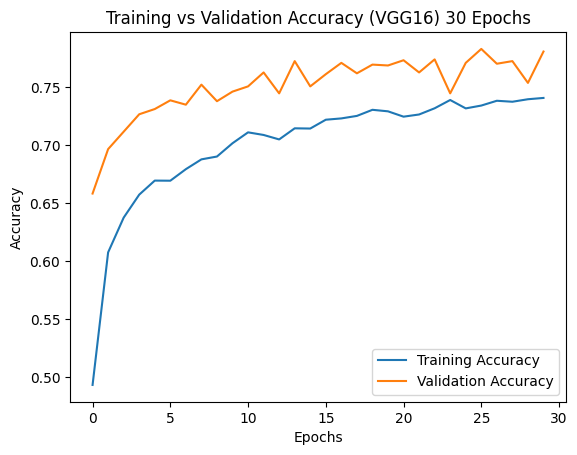

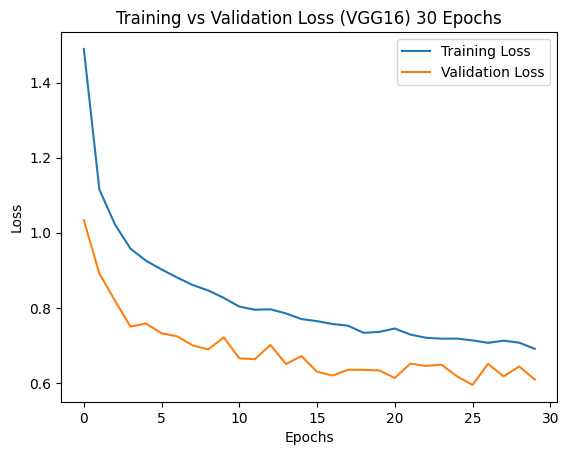

In [ ]:
# Plot the training and validation accuracy
plt.plot(VGG16_history3.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(VGG16_history3.history['loss'], label='Training Loss')
plt.plot(VGG16_history3.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for VGG16 on 30 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━

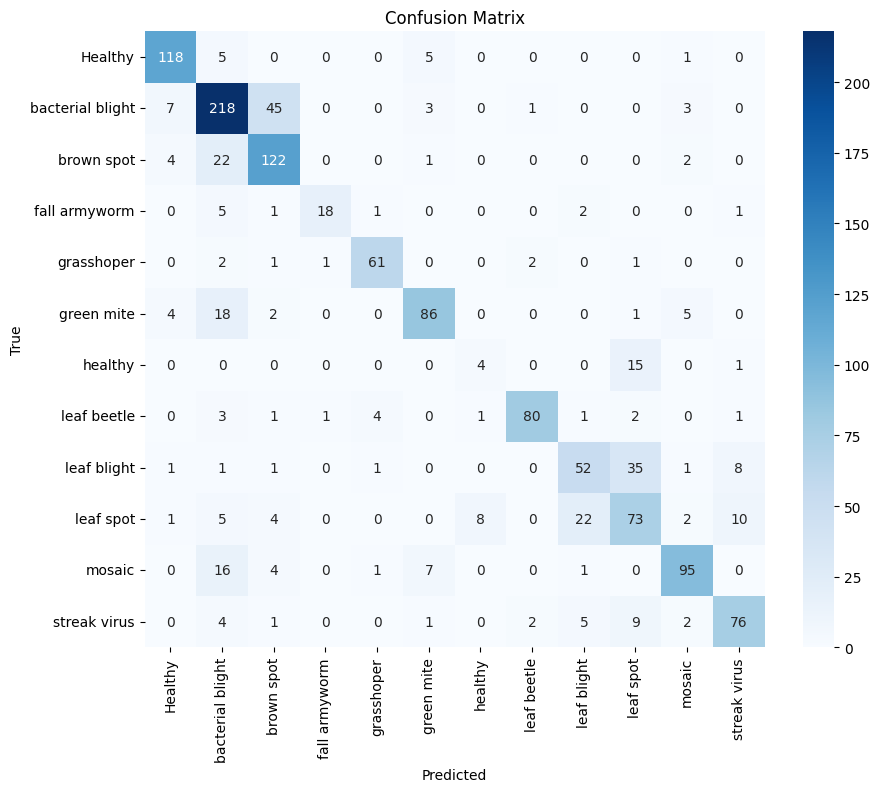

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = VGG16_model1.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Algorithm comparison for 3 VGG16 epochs without early stopping

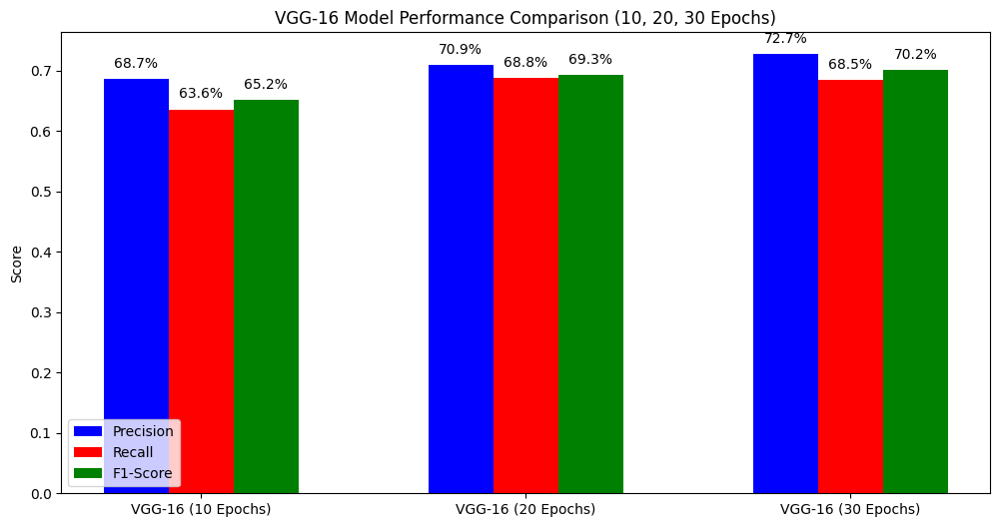

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data for VGG-16 (10 epochs)
vgg_10_precision = [0.89, 0.61, 0.76, 0.69, 0.92, 0.76, 0.00, 0.93, 0.64, 0.55, 0.80, 0.69]
vgg_10_recall = [0.91, 0.86, 0.58, 0.32, 0.81, 0.72, 0.00, 0.90, 0.58, 0.46, 0.74, 0.75]
vgg_10_f1 = [0.90, 0.71, 0.65, 0.44, 0.86, 0.74, 0.00, 0.92, 0.61, 0.50, 0.77, 0.72]

# Data for VGG-16 (20 epochs)
vgg_20_precision = [0.92, 0.78, 0.67, 0.79, 0.89, 0.74, 0.00, 0.93, 0.66, 0.53, 0.78, 0.82]
vgg_20_recall = [0.89, 0.71, 0.88, 0.54, 0.84, 0.82, 0.00, 0.87, 0.50, 0.64, 0.81, 0.75]
vgg_20_f1 = [0.91, 0.75, 0.76, 0.64, 0.86, 0.78, 0.00, 0.90, 0.57, 0.58, 0.79, 0.78]

# Data for VGG-16 (30 epochs)
vgg_30_precision = [0.89, 0.68, 0.76, 0.84, 0.95, 0.80, 0.00, 0.92, 0.58, 0.55, 0.89, 0.87]
vgg_30_recall = [0.91, 0.84, 0.72, 0.57, 0.85, 0.78, 0.00, 0.89, 0.69, 0.52, 0.73, 0.72]
vgg_30_f1 = [0.90, 0.75, 0.73, 0.68, 0.90, 0.79, 0.00, 0.91, 0.63, 0.53, 0.81, 0.79]

# Calculating the mean for each metric (precision, recall, f1) for each epoch
def calculate_mean(values):
    return np.mean(values)

vgg_10_precision_mean = calculate_mean(vgg_10_precision)
vgg_10_recall_mean = calculate_mean(vgg_10_recall)
vgg_10_f1_mean = calculate_mean(vgg_10_f1)

vgg_20_precision_mean = calculate_mean(vgg_20_precision)
vgg_20_recall_mean = calculate_mean(vgg_20_recall)
vgg_20_f1_mean = calculate_mean(vgg_20_f1)

vgg_30_precision_mean = calculate_mean(vgg_30_precision)
vgg_30_recall_mean = calculate_mean(vgg_30_recall)
vgg_30_f1_mean = calculate_mean(vgg_30_f1)

# Data for plotting
epochs = ['VGG-16 (10 Epochs)', 'VGG-16 (20 Epochs)', 'VGG-16 (30 Epochs)']
precision_values = [vgg_10_precision_mean, vgg_20_precision_mean, vgg_30_precision_mean]
recall_values = [vgg_10_recall_mean, vgg_20_recall_mean, vgg_30_recall_mean]
f1_values = [vgg_10_f1_mean, vgg_20_f1_mean, vgg_30_f1_mean]

# Bar width and positions
x = np.arange(len(epochs))
width = 0.2

# Color List for Bar Charts using Hex color codes
precision_color = 'blue'  # Blue
recall_color = 'red'     # Pink
f1_color = 'green'         # Green

# Plotting the histogram
fig, ax = plt.subplots(figsize=(12, 6))
bars_precision = ax.bar(x - width, precision_values, width, label='Precision', color=precision_color)
bars_recall = ax.bar(x, recall_values, width, label='Recall', color=recall_color)
bars_f1 = ax.bar(x + width, f1_values, width, label='F1-Score', color=f1_color)

# Labels and formatting
ax.set_xticks(x)
ax.set_xticklabels(epochs)
ax.set_ylabel('Score')
ax.set_title('VGG-16 Model Performance Comparison (10, 20, 30 Epochs)')
ax.legend()

# Annotating the bars with the percentage values
def add_percentages(bars, values, offset=6):
    for bar, value in zip(bars, values):
        height = bar.get_height()
        ax.annotate(f'{height*100:.1f}%',  # Format as percentage
                    xy=(bar.get_x() + bar.get_width() / 2, height),  # Position of the label
                    xytext=(0, offset),  # Adjust the offset
                    textcoords="offset points",
                    ha='center', va='bottom', color='black')

# Add percentage annotations with a slight offset to avoid overlap
add_percentages(bars_precision, precision_values, offset=6)
add_percentages(bars_recall, recall_values, offset=6)
add_percentages(bars_f1, f1_values, offset=6)

# Show the plot
plt.show()


### MobileNet V2 on 10 epochs

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained MobileNetV2 model without the top layer for transfer learning
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))

# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of MobileNetV2
model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
model3.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history3 = model3.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

<ipython-input-14-ff75350885ec>:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 810ms/step - accuracy: 0.4442 - loss: 1.6707
Epoch 1: val_loss improved from inf to 0.69693, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 327s 942ms/step - accuracy: 0.4446 - loss: 1.6696 - val_accuracy: 0.7513 - val_loss: 0.6969
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 784ms/step - accuracy: 0.6608 - loss: 0.9469
Epoch 2: val_loss improved from 0.69693 to 0.60688, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 288s 863ms/step - accuracy: 0.6609 - loss: 0.9468 - val_accuracy: 0.7678 - val_loss: 0.6069
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 794ms/step - accuracy: 0.6917 - loss: 0.8398
Epoch 3: val_loss improved from 0.60688 to 0.56870, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 292s 874ms/step - accuracy: 0.6917 - loss: 0.8398 - val_accuracy: 0.7881 - val_loss: 0.5687
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 784ms/step - accuracy: 0.6966 - loss: 0.8255
Epoch 4: val_loss improved from 0.56870 to 0.55075, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 318s 863ms/step - accuracy: 0.6966 - loss: 0.8255 - val_accuracy: 0.7806 - val_loss: 0.5507
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - accuracy: 0.7153 - loss: 0.7734
Epoch 5: val_loss did not improve from 0.55075
333/333 ━━━━━━━━━━━━━━━━━━━━ 288s 863ms/step - accuracy: 0.7153 - loss: 0.7734 - val_accuracy: 0.7806 - val_loss: 0.5574
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 781ms/step - accuracy: 0.7243 - loss: 0.7561
Epoch 6: val_loss improved from 0.55075 to 0.50590, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 302s 905ms/step - accuracy: 0.7243 - loss: 0.7561 - val_accuracy: 0.8032 - val_loss: 0.5059
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 770ms/step - accuracy: 0.7344 - loss: 0.7339
Epoch 7: val_loss did not improve from 0.50590
333/333 ━━━━━━━━━━━━━━━━━━━━ 283s 849ms/step - accuracy: 0.7344 - loss: 0.7339 - val_accuracy: 0.7964 - val_loss: 0.5170
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 773ms/step - accuracy: 0.7319 - loss: 0.6915
Epoch 8: val_loss improved from 0.50590 to 0.49654, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 299s 897ms/step - accuracy: 0.7319 - loss: 0.6916 - val_accuracy: 0.8107 - val_loss: 0.4965
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 789ms/step - accuracy: 0.7388 - loss: 0.7108
Epoch 9: val_loss did not improve from 0.49654
333/333 ━━━━━━━━━━━━━━━━━━━━ 289s 868ms/step - accuracy: 0.7388 - loss: 0.7108 - val_accuracy: 0.8039 - val_loss: 0.5084
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 788ms/step - accuracy: 0.7413 - loss: 0.6977
Epoch 10: val_loss did not improve from 0.49654
333/333 ━━━━━━━━━━━━━━━━━━━━ 321s 866ms/step - accuracy: 0.7413 - loss: 0.6977 - val_accuracy: 0.7941 - val_loss: 0.5124
42/42 ━━━━━━━━━━━━━━━━━━━━ 27s 632ms/step - accuracy: 0.7731 - loss: 0.5958
Test accuracy: 0.7778


### Validation Accuracy and Loss for 10 epochs

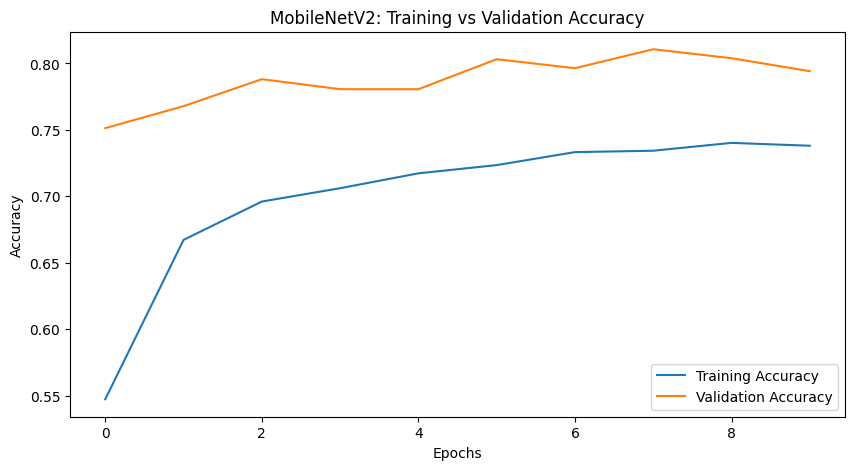

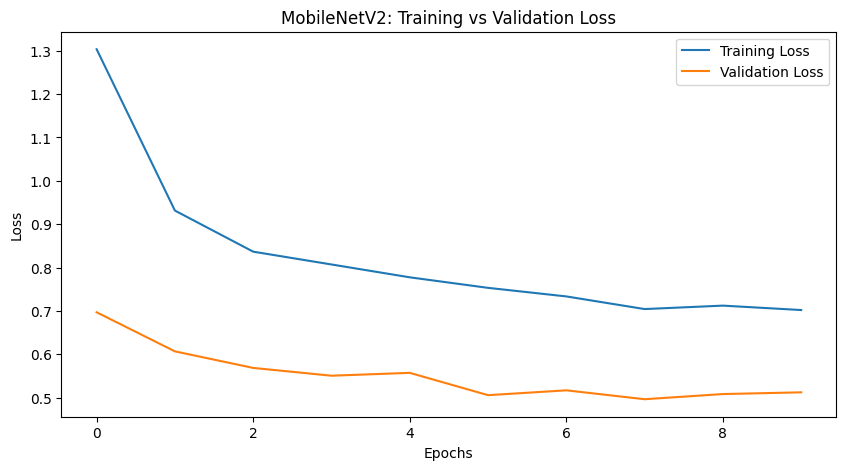

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model Evaluation of mobileNet V2 on 10 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

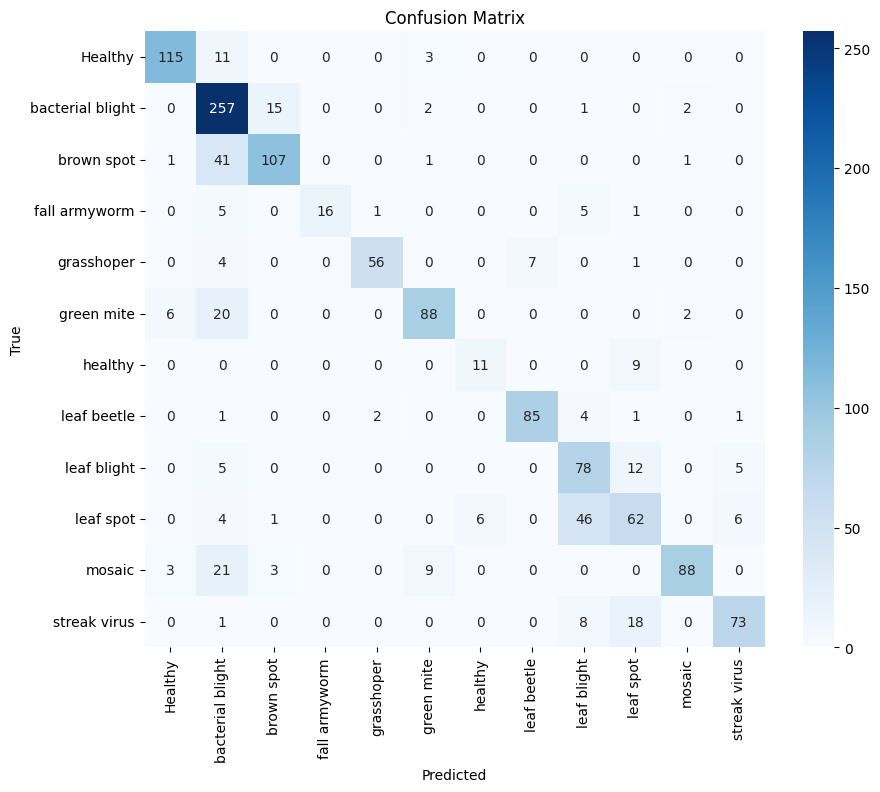

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### MobileNet V2 on 20 epochs

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained MobileNetV2 model without the top layer for transfer learning
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))

# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of MobileNetV2
model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
model3.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history4 = model3.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

<ipython-input-17-6969b8dc8bd4>:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150,150, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - accuracy: 0.4501 - loss: 1.6333
Epoch 1: val_loss improved from inf to 0.69308, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 124s 331ms/step - accuracy: 0.4504 - loss: 1.6322 - val_accuracy: 0.7513 - val_loss: 0.6931
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.6719 - loss: 0.9297
Epoch 2: val_loss improved from 0.69308 to 0.57238, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.6719 - loss: 0.9297 - val_accuracy: 0.7949 - val_loss: 0.5724
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.6908 - loss: 0.8436
Epoch 3: val_loss did not improve from 0.57238
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.6908 - loss: 0.8435 - val_accuracy: 0.7776 - val_loss: 0.5793
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7157 - loss: 0.7696
Epoch 4: val_loss improved from 0.57238 to 0.54158, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 272ms/step - accuracy: 0.7157 - loss: 0.7696 - val_accuracy: 0.7986 - val_loss: 0.5416
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.7218 - loss: 0.7561
Epoch 5: val_loss improved from 0.54158 to 0.53491, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 276ms/step - accuracy: 0.7218 - loss: 0.7561 - val_accuracy: 0.7986 - val_loss: 0.5349
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.7245 - loss: 0.7721
Epoch 6: val_loss did not improve from 0.53491
333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 276ms/step - accuracy: 0.7245 - loss: 0.7720 - val_accuracy: 0.7836 - val_loss: 0.5471
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.7367 - loss: 0.7131
Epoch 7: val_loss improved from 0.53491 to 0.52537, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 273ms/step - accuracy: 0.7367 - loss: 0.7131 - val_accuracy: 0.7956 - val_loss: 0.5254
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.7428 - loss: 0.6937
Epoch 8: val_loss improved from 0.52537 to 0.49461, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 275ms/step - accuracy: 0.7428 - loss: 0.6937 - val_accuracy: 0.8054 - val_loss: 0.4946
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7545 - loss: 0.6823
Epoch 9: val_loss did not improve from 0.49461
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7544 - loss: 0.6823 - val_accuracy: 0.7986 - val_loss: 0.5230
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7512 - loss: 0.6737
Epoch 10: val_loss did not improve from 0.49461
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7512 - loss: 0.6737 - val_accuracy: 0.7919 - val_loss: 0.5118
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7455 - loss: 0.6854
Epoch 11: val_loss improved from 0.49461 to 0.49230, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.7455 - loss: 0.6853 - val_accuracy: 0.8047 - val_loss: 0.4923
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7549 - loss: 0.6740
Epoch 12: val_loss improved from 0.49230 to 0.48008, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 271ms/step - accuracy: 0.7549 - loss: 0.6740 - val_accuracy: 0.8122 - val_loss: 0.4801
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7565 - loss: 0.6418
Epoch 13: val_loss improved from 0.48008 to 0.47866, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.7565 - loss: 0.6418 - val_accuracy: 0.8077 - val_loss: 0.4787
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7547 - loss: 0.6510
Epoch 14: val_loss did not improve from 0.47866
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 265ms/step - accuracy: 0.7547 - loss: 0.6510 - val_accuracy: 0.7934 - val_loss: 0.4916
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7535 - loss: 0.6573
Epoch 15: val_loss did not improve from 0.47866
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7535 - loss: 0.6573 - val_accuracy: 0.8024 - val_loss: 0.5018
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7577 - loss: 0.6514
Epoch 16: val_loss did not improve from 0.47866
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7577 - loss: 0.6514 - val_accuracy: 0.7941 - val_loss: 0.5093
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7619 - loss: 0.6336
Epoch 17: val_loss d

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7544 - loss: 0.6555 - val_accuracy: 0.8129 - val_loss: 0.4601
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7684 - loss: 0.6436
Epoch 19: val_loss did not improve from 0.46014
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7684 - loss: 0.6436 - val_accuracy: 0.7986 - val_loss: 0.5255
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7687 - loss: 0.6205
Epoch 20: val_loss improved from 0.46014 to 0.46000, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7686 - loss: 0.6205 - val_accuracy: 0.8212 - val_loss: 0.4600
42/42 ━━━━━━━━━━━━━━━━━━━━ 12s 299ms/step - accuracy: 0.7930 - loss: 0.5178
Test accuracy: 0.7973


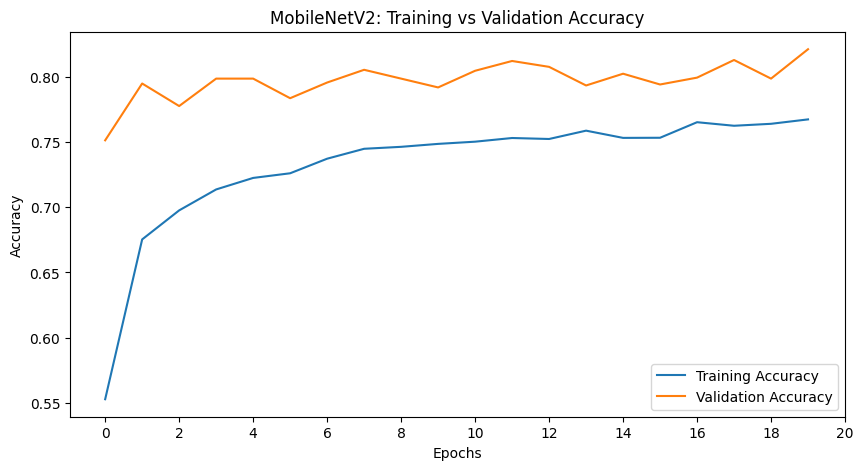

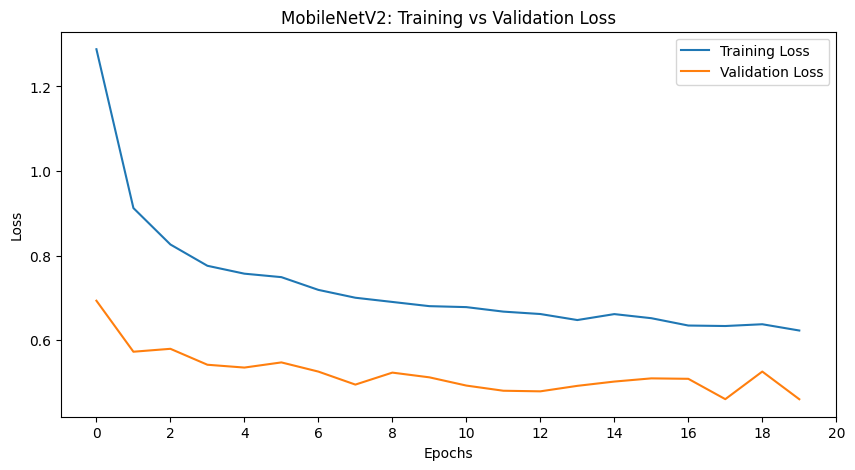

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history4.history['accuracy'], label='Training Accuracy')
plt.plot(history4.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Set x-axis ticks
plt.xticks(np.arange(0, 21, 2))  # Generates ticks at 0, 2, 4, ..., 20

plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set x-axis ticks
plt.xticks(np.arange(0, 21, 2))  # Generates ticks at 0, 2, 4, ..., 20

plt.legend()
plt.show()

### Model Evaluation on 20 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━

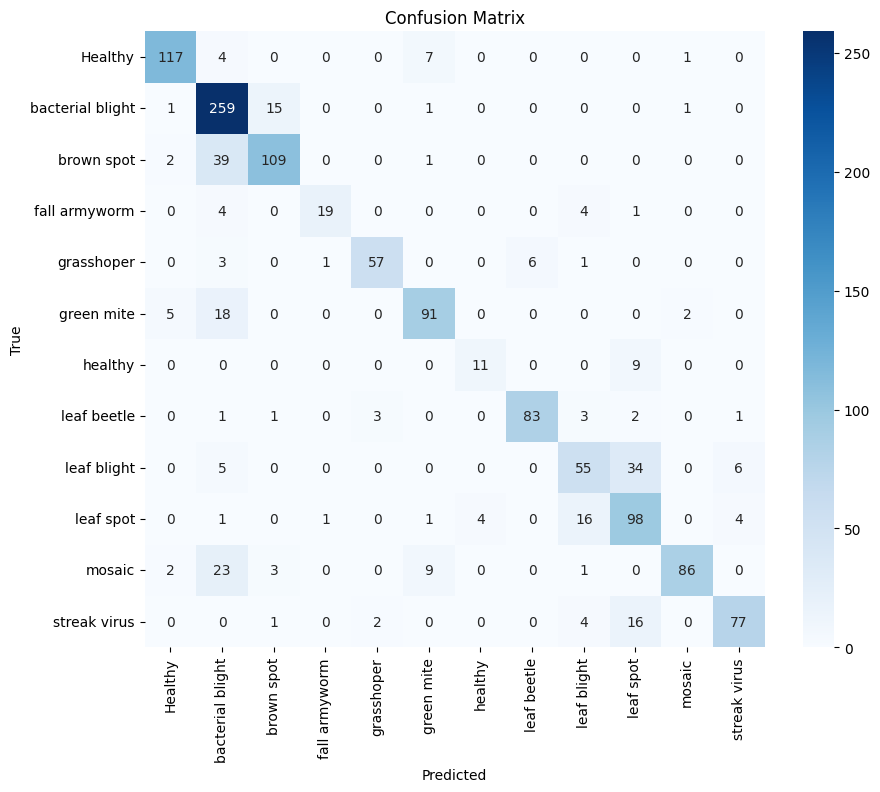

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

### MobileNet V2 on 30 epochs

In [ ]:
# Train the model
history5 = model3.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7580 - loss: 0.6309
Epoch 1: val_loss did not improve from 0.46000
333/333 ━━━━━━━━━━━━━━━━━━━━ 88s 264ms/step - accuracy: 0.7580 - loss: 0.6309 - val_accuracy: 0.8174 - val_loss: 0.4612
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.7720 - loss: 0.6120
Epoch 2: val_loss did not improve from 0.46000
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 270ms/step - accuracy: 0.7720 - loss: 0.6120 - val_accuracy: 0.8069 - val_loss: 0.4785
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7670 - loss: 0.6153
Epoch 3: val_loss did not improve from 0.46000
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7670 - loss: 0.6153 - val_accuracy: 0.8009 - val_loss: 0.4940
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7671 - loss: 0.6254
Epoch 4: val_loss did not improve from 0.46000
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7671 - loss: 0.6253 - val_accuracy: 0.8182

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7740 - loss: 0.5997 - val_accuracy: 0.8257 - val_loss: 0.4524
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7755 - loss: 0.5939
Epoch 9: val_loss improved from 0.45240 to 0.43859, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7755 - loss: 0.5939 - val_accuracy: 0.8189 - val_loss: 0.4386
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7787 - loss: 0.5912
Epoch 10: val_loss did not improve from 0.43859
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7787 - loss: 0.5912 - val_accuracy: 0.8174 - val_loss: 0.4636
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.7829 - loss: 0.5810
Epoch 11: val_loss did not improve from 0.43859
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 266ms/step - accuracy: 0.7829 - loss: 0.5810 - val_accuracy: 0.8204 - val_loss: 0.4542
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7759 - loss: 0.6043
Epoch 12: val_loss did not improve from 0.43859
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7759 - loss: 0.6043 - val_accuracy: 0.8227 - val_loss: 0.4533
Epoch 13/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7798 - loss: 0.5729
Epoch 13: val_loss d

333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7759 - loss: 0.5838 - val_accuracy: 0.8204 - val_loss: 0.4335
Epoch 16/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7804 - loss: 0.5695
Epoch 16: val_loss did not improve from 0.43349
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7804 - loss: 0.5695 - val_accuracy: 0.8257 - val_loss: 0.4606
Epoch 17/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7838 - loss: 0.5785
Epoch 17: val_loss improved from 0.43349 to 0.43038, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 268ms/step - accuracy: 0.7838 - loss: 0.5785 - val_accuracy: 0.8430 - val_loss: 0.4304
Epoch 18/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7756 - loss: 0.5948
Epoch 18: val_loss did not improve from 0.43038
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7756 - loss: 0.5947 - val_accuracy: 0.8257 - val_loss: 0.4338
Epoch 19/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7811 - loss: 0.5692
Epoch 19: val_loss did not improve from 0.43038
333/333 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.7811 - loss: 0.5693 - val_accuracy: 0.8295 - val_loss: 0.4346
Epoch 20/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.7838 - loss: 0.5723
Epoch 20: val_loss did not improve from 0.43038
333/333 ━━━━━━━━━━━━━━━━━━━━ 90s 269ms/step - accuracy: 0.7838 - loss: 0.5723 - val_accuracy: 0.8039 - val_loss: 0.4996
Epoch 21/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7722 - loss: 0.5916
Epoch 21: val_loss d

### Validation Accuracy and Loss for 30 epochs

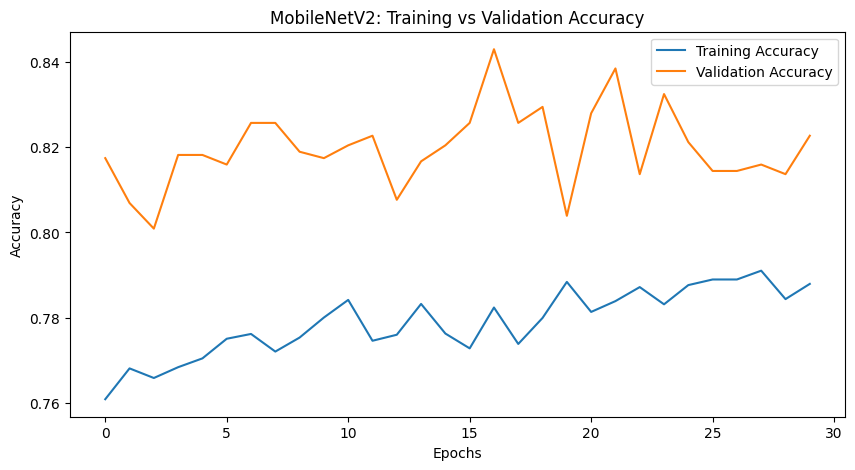

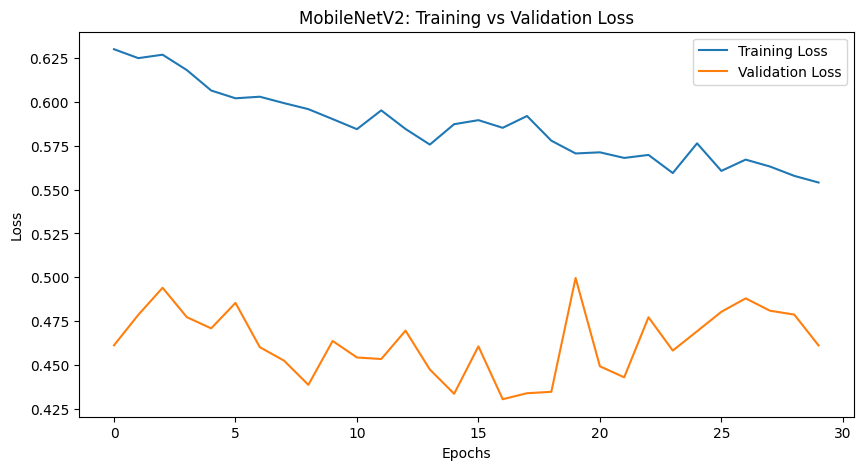

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history5.history['accuracy'], label='Training Accuracy')
plt.plot(history5.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history5.history['loss'], label='Training Loss')
plt.plot(history5.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Model evaluation on 30 epochs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━

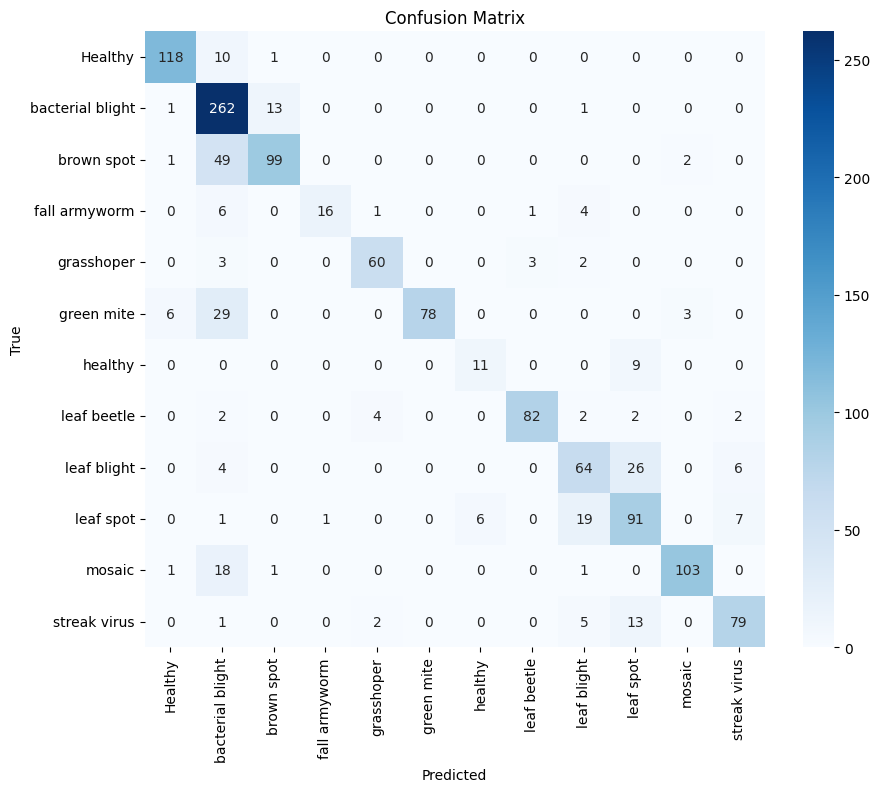

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model3.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

#### Algorithm comparison of 10 , 20 and 30 epochs of MobileNet V2

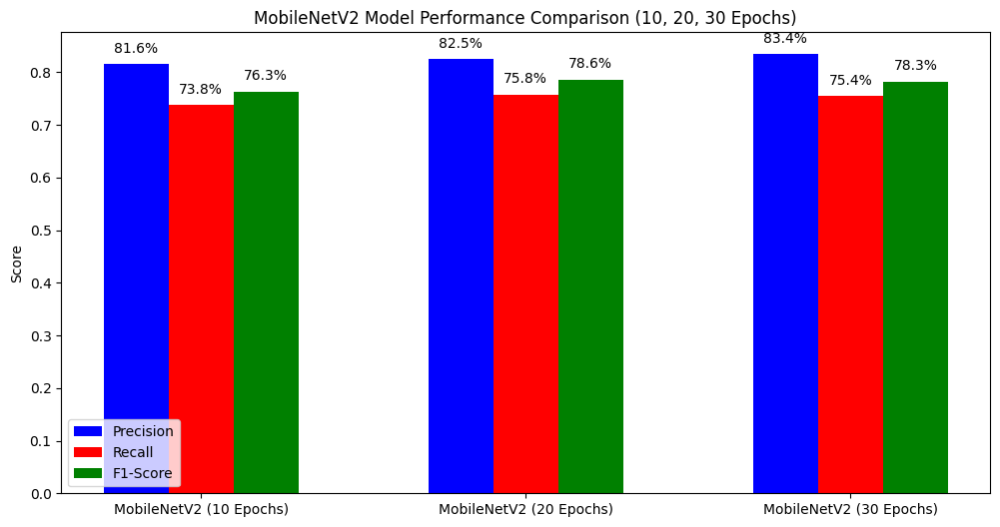

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data for MobileNetV2 (10 epochs)
mobilenet_10_precision = [0.92, 0.69, 0.85, 1.00, 0.95, 0.85, 0.65, 0.92, 0.55, 0.60, 0.95, 0.86]
mobilenet_10_recall = [0.89, 0.93, 0.71, 0.57, 0.82, 0.76, 0.55, 0.90, 0.78, 0.50, 0.71, 0.73]
mobilenet_10_f1 = [0.91, 0.79, 0.77, 0.73, 0.88, 0.80, 0.59, 0.91, 0.64, 0.54, 0.81, 0.79]

# Data for MobileNetV2 (20 epochs)
mobilenet_20_precision = [0.92, 0.73, 0.84, 0.90, 0.92, 0.83, 0.73, 0.93, 0.65, 0.61, 0.96, 0.88]
mobilenet_20_recall = [0.91, 0.94, 0.72, 0.68, 0.84, 0.78, 0.55, 0.88, 0.55, 0.78, 0.69, 0.77]
mobilenet_20_f1 = [0.91, 0.82, 0.78, 0.78, 0.88, 0.81, 0.63, 0.91, 0.60, 0.69, 0.80, 0.82]

# Data for MobileNetV2 (30 epochs)
mobilenet_30_precision = [0.93, 0.68, 0.87, 0.94, 0.90, 1.00, 0.65, 0.95, 0.65, 0.65, 0.95, 0.84]
mobilenet_30_recall = [0.91, 0.95, 0.66, 0.57, 0.88, 0.67, 0.55, 0.87, 0.64, 0.73, 0.83, 0.79]
mobilenet_30_f1 = [0.92, 0.79, 0.75, 0.71, 0.89, 0.80, 0.59, 0.91, 0.65, 0.68, 0.89, 0.81]

# Calculating the mean for each metric (precision, recall, f1) for each epoch
def calculate_mean(values):
    return np.mean(values)

mobilenet_10_precision_mean = calculate_mean(mobilenet_10_precision)
mobilenet_10_recall_mean = calculate_mean(mobilenet_10_recall)
mobilenet_10_f1_mean = calculate_mean(mobilenet_10_f1)

mobilenet_20_precision_mean = calculate_mean(mobilenet_20_precision)
mobilenet_20_recall_mean = calculate_mean(mobilenet_20_recall)
mobilenet_20_f1_mean = calculate_mean(mobilenet_20_f1)

mobilenet_30_precision_mean = calculate_mean(mobilenet_30_precision)
mobilenet_30_recall_mean = calculate_mean(mobilenet_30_recall)
mobilenet_30_f1_mean = calculate_mean(mobilenet_30_f1)

# Data for plotting
epochs = ['MobileNetV2 (10 Epochs)', 'MobileNetV2 (20 Epochs)', 'MobileNetV2 (30 Epochs)']
precision_values = [mobilenet_10_precision_mean, mobilenet_20_precision_mean, mobilenet_30_precision_mean]
recall_values = [mobilenet_10_recall_mean, mobilenet_20_recall_mean, mobilenet_30_recall_mean]
f1_values = [mobilenet_10_f1_mean, mobilenet_20_f1_mean, mobilenet_30_f1_mean]

# Bar width and positions
x = np.arange(len(epochs))
width = 0.2

# Color List for Bar Charts using Hex color codes
precision_color = 'blue'  # Blue
recall_color = 'red'     # Pink
f1_color = 'green'         # Green
# Plotting the histogram
fig, ax = plt.subplots(figsize=(12, 6))
bars_precision = ax.bar(x - width, precision_values, width, label='Precision', color=precision_color)
bars_recall = ax.bar(x, recall_values, width, label='Recall', color=recall_color)
bars_f1 = ax.bar(x + width, f1_values, width, label='F1-Score', color=f1_color)

# Labels and formatting
ax.set_xticks(x)
ax.set_xticklabels(epochs)
ax.set_ylabel('Score')
ax.set_title('MobileNetV2 Model Performance Comparison (10, 20, 30 Epochs)')
ax.legend()

# Annotating the bars with the percentage values
def add_percentages(bars, values, offset=6):
    for bar, value in zip(bars, values):
        height = bar.get_height()
        ax.annotate(f'{height*100:.1f}%',  # Format as percentage
                    xy=(bar.get_x() + bar.get_width() / 2, height),  # Position of the label
                    xytext=(0, offset),  # Adjust the offset
                    textcoords="offset points",
                    ha='center', va='bottom', color='black')

# Add percentage annotations with a slight offset to avoid overlap
add_percentages(bars_precision, precision_values, offset=6)
add_percentages(bars_recall, recall_values, offset=6)
add_percentages(bars_f1, f1_values, offset=6)

# Show the plot
plt.show()


### Proposed Hybrid Model
#### 10 Epochs







In [14]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=10, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


<ipython-input-14-d947e404c790>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 303s 549ms/step - accuracy: 0.4480 - loss: 1.8162 - val_accuracy: 0.5950 - val_loss: 2.1816 - learning_rate: 3.0000e-04
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 100s 298ms/step - accuracy: 0.7052 - loss: 0.8832 - val_accuracy: 0.6116 - val_loss: 2.2444 - learning_rate: 3.0000e-04
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 100s 301ms/step - accuracy: 0.7516 - loss: 0.7333 - val_accuracy: 0.6506 - val_loss: 1.7034 - learning_rate: 3.0000e-04
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 100s 299ms/step - accuracy: 0.7672 - loss: 0.6438 - val_accuracy: 0.6304 - val_loss: 1.4972 - learning_rate: 3.0000e-04
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 99s 298ms/step - accuracy: 0.7799 - loss: 0.6375 - val_accuracy: 0.7678 - val_loss: 0.8293 - learning_rate: 3.0000e-04
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 98s 294ms/step - accuracy: 0.7970 - loss: 0.5601 - val_accuracy: 0.7183 - val_loss: 1.1793 - learning_rate: 3.0000e-04
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 99

### Test Accuracy on 10 epochs

In [ ]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")

42/42 ━━━━━━━━━━━━━━━━━━━━ 205s 5s/step - accuracy: 0.8395 - loss: 0.4459
Test Accuracy: 0.8303


### Validation Accuracy and loss for 10 epochs

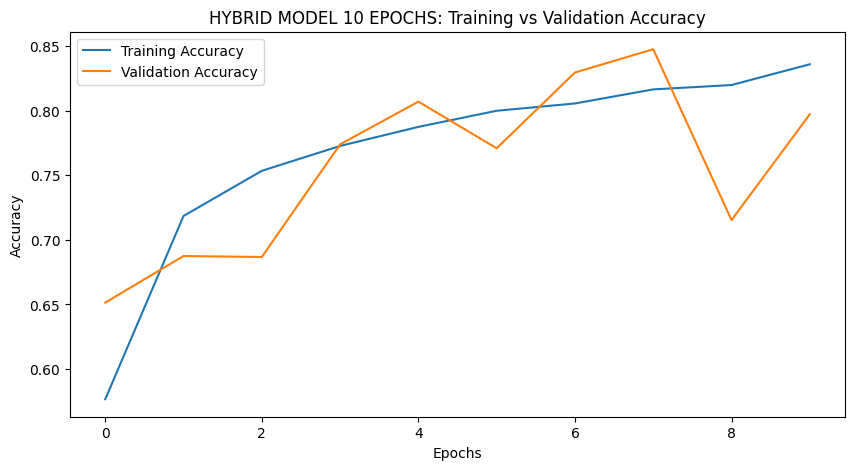

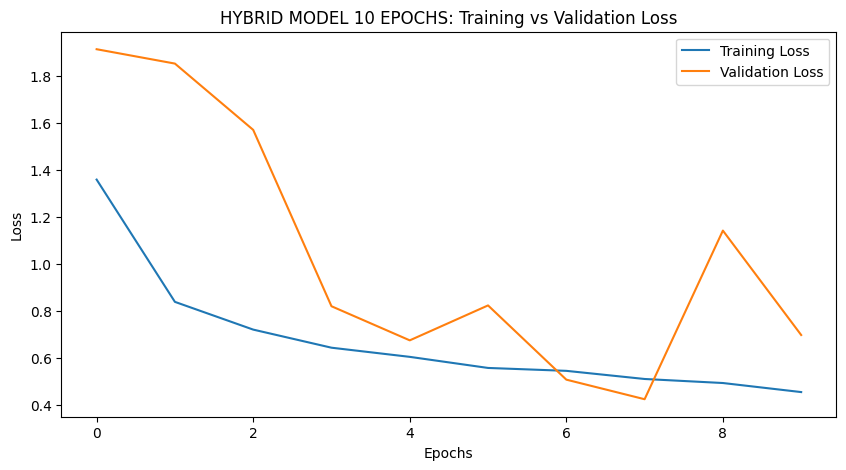

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 10 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 10 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Hybrid Model 20 epochs

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=20, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


<ipython-input-23-8c1c70e59bf6>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 342s 614ms/step - accuracy: 0.4538 - loss: 1.8385 - val_accuracy: 0.6499 - val_loss: 1.7680 - learning_rate: 3.0000e-04
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 276ms/step - accuracy: 0.7090 - loss: 0.8683 - val_accuracy: 0.7107 - val_loss: 1.3234 - learning_rate: 3.0000e-04
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 273ms/step - accuracy: 0.7565 - loss: 0.7190 - val_accuracy: 0.7686 - val_loss: 0.8192 - learning_rate: 3.0000e-04
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 277ms/step - accuracy: 0.7773 - loss: 0.6500 - val_accuracy: 0.7708 - val_loss: 0.7660 - learning_rate: 3.0000e-04
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 274ms/step - accuracy: 0.7849 - loss: 0.6222 - val_accuracy: 0.7573 - val_loss: 0.9069 - learning_rate: 3.0000e-04
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 91s 273ms/step - accuracy: 0.7901 - loss: 0.5837 - val_accuracy: 0.7979 - val_loss: 0.6684 - learning_rate: 3.0000e-04
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 92s 2

### Test Accuracy on 20 epochs

In [ ]:
# Evaluate on test data
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")


42/42 ━━━━━━━━━━━━━━━━━━━━ 27s 642ms/step - accuracy: 0.8848 - loss: 0.2836
Test Accuracy: 0.8821


### VALIDATION ACCURACY AND LOSS FOR 20 EPOCHS

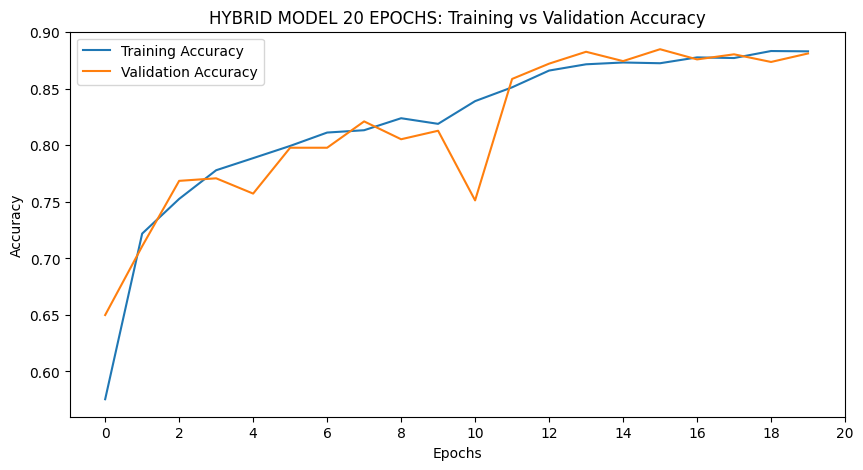

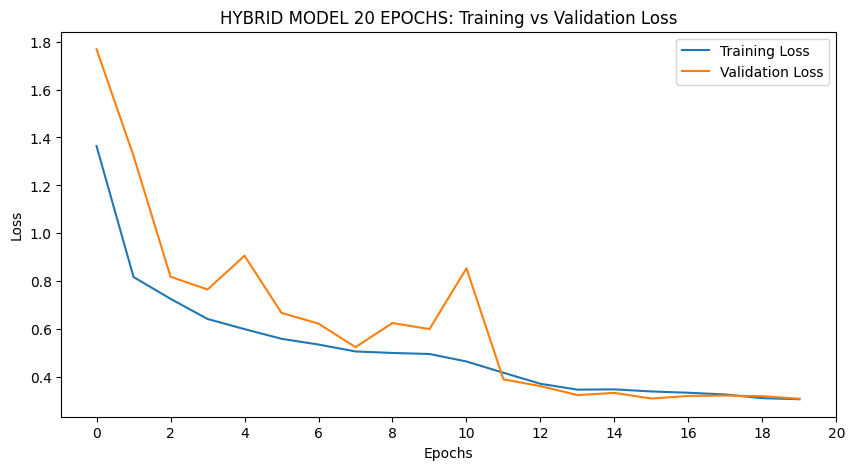

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 20 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Set x-axis ticks
plt.xticks(np.arange(0, 21, 2))  # Generates ticks at 0, 2, 4, ..., 20

plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 20 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set x-axis ticks
plt.xticks(np.arange(0, 21, 2))  # Generates ticks at 0, 2, 4, ..., 20

plt.legend()
plt.show()

### Hybrid Model 30 Epochs

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D, Concatenate, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50, EfficientNetB3, MobileNetV2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Image size (Ensure consistency across models)
IMG_SIZE = (150, 150, 3)
BATCH_SIZE = 32

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=40, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.3,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, x_col='image_path', y_col='class',
    target_size=(150, 150), batch_size=BATCH_SIZE, class_mode='categorical')

# Get number of classes
num_classes = len(train_generator.class_indices)

# Define a single input tensor that will be shared across models
input_tensor = Input(shape=IMG_SIZE)

# Load pre-trained models without top layers
resnet = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)
effnet = EfficientNetB3(weights='imagenet', include_top=False, input_tensor=input_tensor)
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze initial layers
for layer in resnet.layers[:140]: layer.trainable = False
for layer in effnet.layers[:180]: layer.trainable = False
for layer in mobilenet.layers[:130]: layer.trainable = False

# Feature extraction
resnet_out = GlobalAveragePooling2D()(resnet.output)
effnet_out = GlobalAveragePooling2D()(effnet.output)
mobilenet_out = GlobalAveragePooling2D()(mobilenet.output)

# Concatenate features from all models
merged = Concatenate()([resnet_out, effnet_out, mobilenet_out])
merged = BatchNormalization()(merged)  # Normalize features for stability

# Fully connected layers
x = Dense(512, activation='relu')(merged)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes, activation='softmax')(x)  # Corrected num_classes

# Define model with a single shared input
model = Model(inputs=input_tensor, outputs=output)

# Compile model
model.compile(optimizer=AdamW(learning_rate=3e-4, weight_decay=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
]

# Train model
history = model.fit(train_generator, validation_data=valid_generator,
                    epochs=30, batch_size=BATCH_SIZE, callbacks=callbacks)

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


<ipython-input-14-9c759e649559>:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_tensor)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 681s 2s/step - accuracy: 0.4530 - loss: 1.7762 - val_accuracy: 0.6694 - val_loss: 1.6570 - learning_rate: 3.0000e-04
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 614s 2s/step - accuracy: 0.7124 - loss: 0.8613 - val_accuracy: 0.7393 - val_loss: 1.2591 - learning_rate: 3.0000e-04
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 614s 2s/step - accuracy: 0.7466 - loss: 0.7238 - val_accuracy: 0.7446 - val_loss: 0.6999 - learning_rate: 3.0000e-04
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 617s 2s/step - accuracy: 0.7795 - loss: 0.6037 - val_accuracy: 0.7829 - val_loss: 0.8022 - learning_rate: 3.0000e-04
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 620s 2s/step - accuracy: 0.7930 - loss: 0.5883 - val_accuracy: 0.8039 - val_loss: 0.6664 - learning_rate: 3.0000e-04
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 618s 2s/step - accuracy: 0.7999 - loss: 0.5589 - val_accuracy: 0.7889 - val_loss: 0.7803 - learning_rate: 3.0000e-04
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 623s 2s/step - acc

### Test Accuracy on 30 Epochs

In [ ]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")

42/42 ━━━━━━━━━━━━━━━━━━━━ 35s 818ms/step - accuracy: 0.8934 - loss: 0.2695
Test Accuracy: 0.8806


### VALIDATION ACCURACY AND LOSS FOR 30 EPOCHS

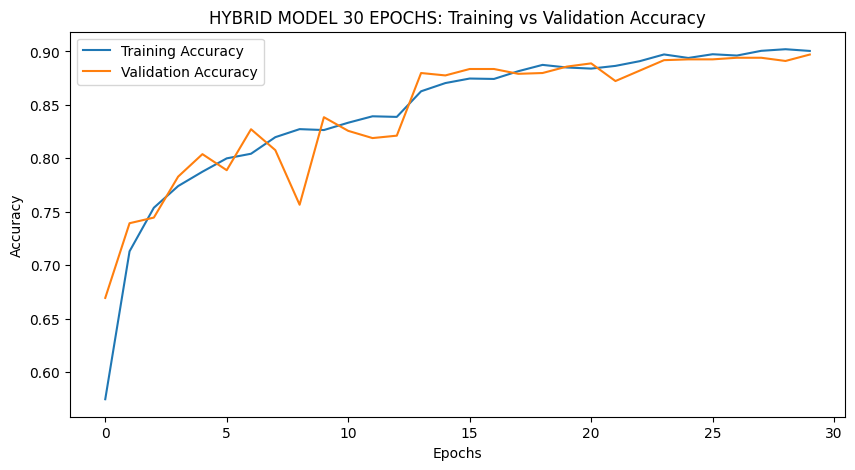

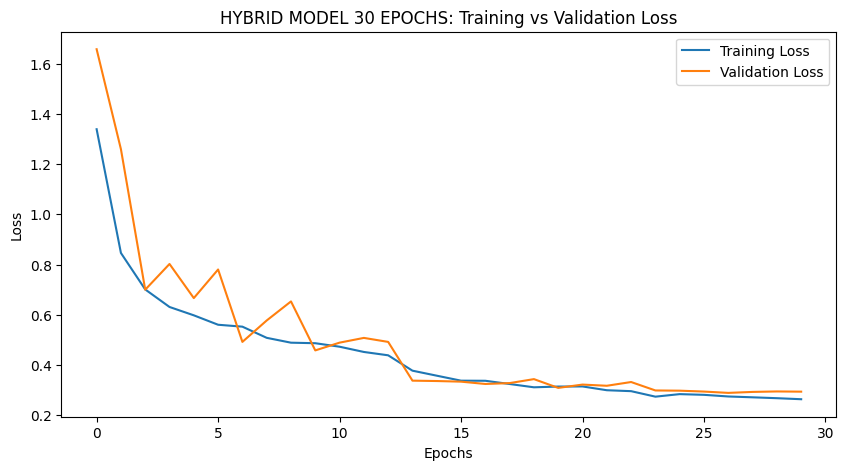

In [ ]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('HYBRID MODEL 30 EPOCHS: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('HYBRID MODEL 30 EPOCHS: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Hybrid Model Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 812ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 833ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

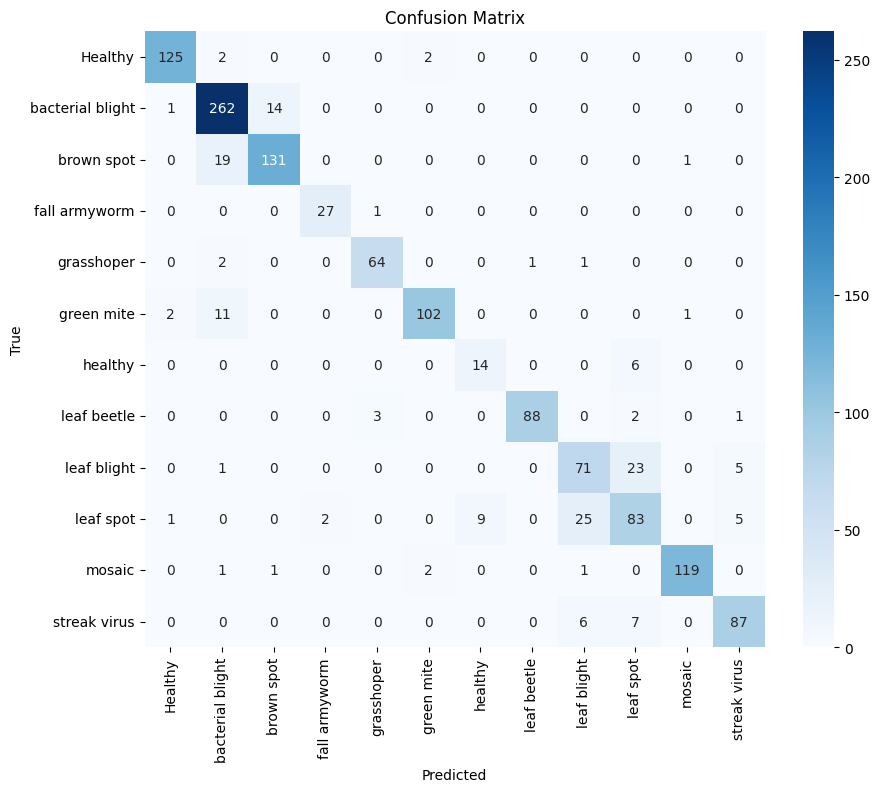

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get true labels and predictions
true_labels = []
predicted_labels = []

# Iterate over the test generator to collect true labels and predicted labels
for images, labels in test_generator:
    predictions = model.predict(images)
    true_labels.extend(np.argmax(labels, axis=1))  # Convert one-hot encoded labels to class indices
    predicted_labels.extend(np.argmax(predictions, axis=1))  # Get the predicted class index

    # If we've reached the end of the test set (no more data in the generator), break the loop
    if len(true_labels) >= test_generator.samples:
        break

# Now, compute accuracy and classification report
test_accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Test accuracy: {test_accuracy:.4f}")

# Generate classification report
report = classification_report(true_labels, predicted_labels, target_names=test_generator.class_indices.keys())
print("\nClassification Report:")
print(report)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

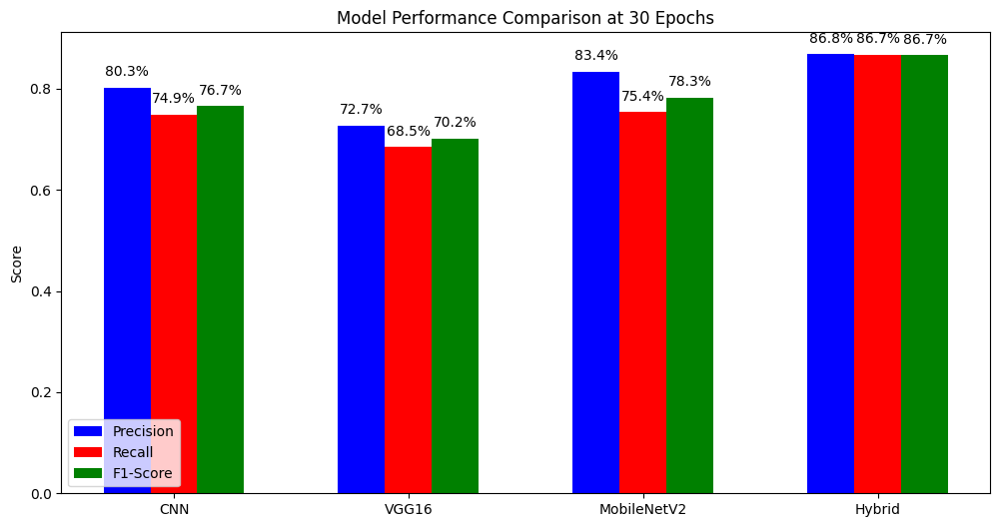

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data for models (Precision, Recall, F1-score for 30 epochs)
cnn_precision = [0.94, 0.83, 0.80, 0.71, 0.83, 0.88, 0.64, 0.96, 0.65, 0.61, 0.97, 0.81]
cnn_recall = [0.95, 0.87, 0.93, 0.36, 0.85, 0.67, 0.45, 0.85, 0.65, 0.78, 0.86, 0.77]
cnn_f1 = [0.95, 0.85, 0.86, 0.48, 0.84, 0.76, 0.53, 0.90, 0.65, 0.68, 0.91, 0.79]

vgg16_precision = [0.89, 0.68, 0.76, 0.84, 0.95, 0.80, 0.00, 0.92, 0.58, 0.55, 0.89, 0.87]
vgg16_recall = [0.91, 0.84, 0.72, 0.57, 0.85, 0.78, 0.00, 0.89, 0.69, 0.52, 0.73, 0.72]
vgg16_f1 = [0.90, 0.75, 0.73, 0.68, 0.90, 0.79, 0.00, 0.91, 0.63, 0.53, 0.81, 0.79]

mobilenet_precision = [0.93, 0.68, 0.87, 0.94, 0.90, 1.00, 0.65, 0.95, 0.65, 0.65, 0.95, 0.84]
mobilenet_recall = [0.91, 0.95, 0.66, 0.57, 0.88, 0.67, 0.55, 0.87, 0.64, 0.73, 0.83, 0.79]
mobilenet_f1 = [0.92, 0.79, 0.75, 0.71, 0.89, 0.80, 0.59, 0.91, 0.65, 0.68, 0.89, 0.81]

hybrid_precision = [0.97, 0.88, 0.90, 0.93, 0.94, 0.96, 0.61, 0.99, 0.68, 0.69, 0.98, 0.89]
hybrid_recall = [0.97, 0.95, 0.87, 0.96, 0.94, 0.88, 0.70, 0.94, 0.71, 0.66, 0.96, 0.87]
hybrid_f1 = [0.97, 0.91, 0.88, 0.95, 0.94, 0.92, 0.65, 0.96, 0.70, 0.67, 0.97, 0.88]

# Function to calculate the mean of a list
def calculate_mean(values):
    return np.mean(values)

# Calculate the mean for each model's precision, recall, and f1
cnn_precision_mean = calculate_mean(cnn_precision)
cnn_recall_mean = calculate_mean(cnn_recall)
cnn_f1_mean = calculate_mean(cnn_f1)

vgg16_precision_mean = calculate_mean(vgg16_precision)
vgg16_recall_mean = calculate_mean(vgg16_recall)
vgg16_f1_mean = calculate_mean(vgg16_f1)

mobilenet_precision_mean = calculate_mean(mobilenet_precision)
mobilenet_recall_mean = calculate_mean(mobilenet_recall)
mobilenet_f1_mean = calculate_mean(mobilenet_f1)

hybrid_precision_mean = calculate_mean(hybrid_precision)
hybrid_recall_mean = calculate_mean(hybrid_recall)
hybrid_f1_mean = calculate_mean(hybrid_f1)

# Data for plotting
models = ['CNN', 'VGG16', 'MobileNetV2', 'Hybrid']
precision_values = [cnn_precision_mean, vgg16_precision_mean, mobilenet_precision_mean, hybrid_precision_mean]
recall_values = [cnn_recall_mean, vgg16_recall_mean, mobilenet_recall_mean, hybrid_recall_mean]
f1_values = [cnn_f1_mean, vgg16_f1_mean, mobilenet_f1_mean, hybrid_f1_mean]

# Bar width and positions
x = np.arange(len(models))
width = 0.2

# Color List for Bar Charts using Hex color codes
precision_color = 'blue'  # Blue
recall_color = 'red'     # Pink
f1_color = 'green'         # green

# Plotting the histogram
fig, ax = plt.subplots(figsize=(12, 6))
bars_precision = ax.bar(x - width, precision_values, width, label='Precision', color=precision_color)
bars_recall = ax.bar(x, recall_values, width, label='Recall', color=recall_color)
bars_f1 = ax.bar(x + width, f1_values, width, label='F1-Score', color=f1_color)

# Labels and formatting
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.set_ylabel('Score')
ax.set_title('Model Performance Comparison at 30 Epochs')
ax.legend()

# Annotating the bars with the percentage values
def add_percentages(bars, values, offset=6):
    for bar, value in zip(bars, values):
        height = bar.get_height()
        ax.annotate(f'{height*100:.1f}%',  # Format as percentage
                    xy=(bar.get_x() + bar.get_width() / 2, height),  # Position of the label
                    xytext=(0, offset),  # Adjust the offset
                    textcoords="offset points",
                    ha='center', va='bottom', color='black')

# Add percentage annotations with a slight offset to avoid overlap
add_percentages(bars_precision, precision_values, offset=6)
add_percentages(bars_recall, recall_values, offset=6)
add_percentages(bars_f1, f1_values, offset=6)

# Show the plot
plt.show()

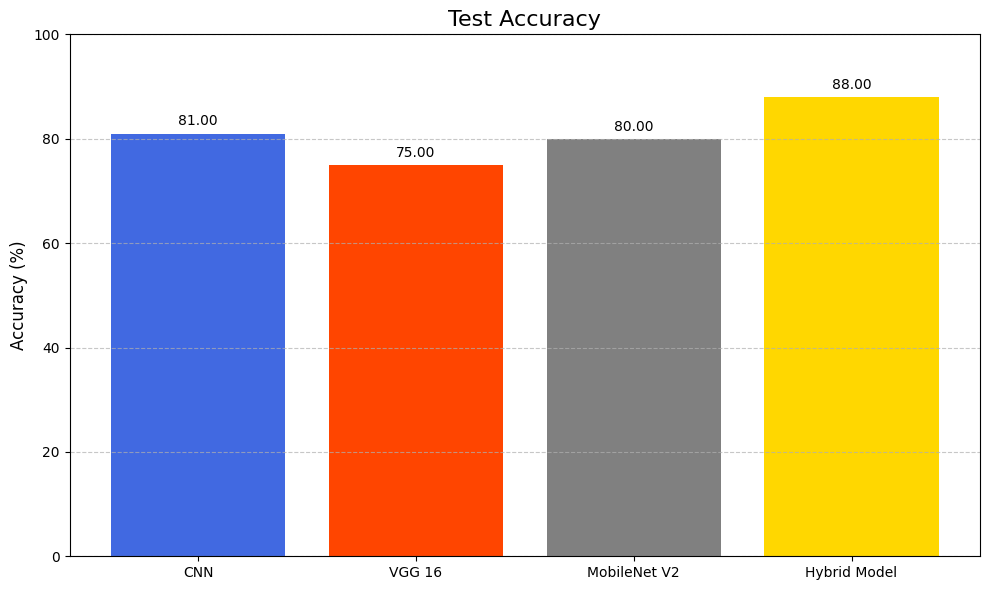

In [ ]:
import matplotlib.pyplot as plt

# Models and their accuracies
models = ['CNN', 'VGG 16', 'MobileNet V2', 'Hybrid Model']
accuracies = [0.81, 0.75, 0.80, 0.88]

# Define colors for bars (similar to the reference image style)
colors = ['royalblue', 'orangered', 'gray', 'gold']

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(models, [a * 100 for a in accuracies], color=colors)

# Add value labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2.0, yval + 1, f'{yval:.2f}', ha='center', va='bottom', fontsize=10)

# Title and labels
plt.title('Test Accuracy', fontsize=16)
plt.ylabel('Accuracy (%)', fontsize=12)
plt.ylim(0, 100)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


### Hybrid Model User Input
#### (1) User Input based on the image class of the maize and cassava folder to see the prediction percentage of it being classified

Enter a label (fall armyworm, grasshoper, healthy, leaf beetle, leaf blight, leaf spot, streak virus, bacterial blight, brown spot, green mite, Healthy, mosaic) or "*" to quit: brown spot
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


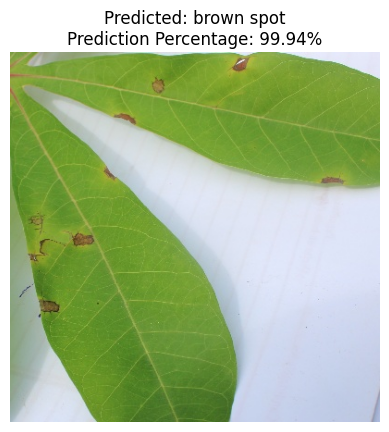

Actual label: brown spot
Predicted label: brown spot
Prediction percentage: 99.94%


In [ ]:
import os
import cv2 as cv
import random
import numpy as np
import matplotlib.pyplot as plt

# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Combine Maize and Cassava folder names into a single labels list
labels = maize_folders + cassava_folders

# Define the image size for model input
image_size = (150, 150)

# Function to allow user input and display images and accuracy
def user_input_and_accuracy(labels, model):
    correct_predictions = 0
    total_predictions = 0

    while True:
        # Get user input
        user_input = input(f'Enter a label ({", ".join(labels)}) or "*" to quit: ').strip().lower()
        if user_input == '*':
            break
        if user_input not in labels:
            print("Invalid input. Please enter a valid label.")
            continue

        # Select the base directory and label folder based on user input
        if user_input in maize_folders:
            base_dir = maize_base_dir
        elif user_input in cassava_folders:
            base_dir = cassava_base_dir
        else:
            print("Invalid label input.")
            continue

        # Select a random image with the user input label
        label_folder = os.path.join(base_dir, user_input)
        img_name = random.choice(os.listdir(label_folder))
        img_path = os.path.join(label_folder, img_name)
        img = cv.imread(img_path)
        img_resized = cv.resize(img, image_size)
        img_resized = np.expand_dims(img_resized, axis=0) / 255.0  # Rescale

        # Predict the image using the trained model
        prediction = model.predict(img_resized)
        predicted_label = labels[np.argmax(prediction)]
        prediction_percentage = prediction[0][np.argmax(prediction)] * 100

        # Display the image
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'Predicted: {user_input}\nPrediction Percentage: {prediction_percentage:.2f}%')
        plt.show()

        # Determine if the user's input is correct
        correct = user_input == predicted_label
        total_predictions += 1
        if correct:
            correct_predictions += 1

        # Calculate and display accuracy
        accuracy = (correct_predictions / total_predictions) * 100
        print(f"Actual label: {user_input}")
        print(f"Predicted label: {user_input}")
        print(f"Prediction percentage: {prediction_percentage:.2f}%")

        input("Press Enter to continue...")

        # Check if accuracy is below 80%
        if accuracy < 80:
            print("Accuracy is below 80%. Please try again.")
            break  # Exit loop if accuracy falls below 80%

# Assuming the model is already loaded and available, call the function
user_input_and_accuracy(labels, model)

### Hybrid Model User Input
#### (2) User Input based on uploading random images from online sources for generalisation

Paste the image URL: https://www.planetnatural.com/wp-content/uploads/2023/08/Spinach-leaf-spot-disease-920x518.webp
Enter the actual label (optional): leaf spot
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


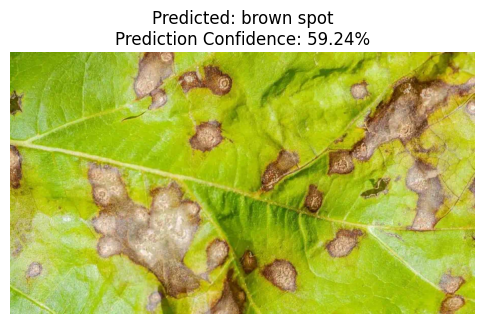

Prediction Details
Actual label:    leaf spot
Predicted label: brown spot
Confidence:      59.24%


In [18]:
import requests
from io import BytesIO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Automatically get class names from the test generator
class_indices = test_generator.class_indices
class_names = [class_name for class_name, _ in sorted(class_indices.items(), key=lambda item: item[1])]

# Set the image size
image_size = (150, 150)

def predict_from_url(image_url, model, class_names, actual_label=None):
    try:
        # Download and prepare image input
        response = requests.get(image_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert("RGB")
        img_resized = img.resize(image_size)

        # Preprocess the model
        img_array = np.array(img_resized) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        # Code to Predict images and class they belong
        prediction = model.predict(img_array)
        predicted_class_idx = np.argmax(prediction)
        predicted_class = class_names[predicted_class_idx]
        prediction_percentage = prediction[0][predicted_class_idx] * 100

        # Display images
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {predicted_class}\nPrediction Confidence: {prediction_percentage:.2f}%")
        plt.show()

        # Print results
        print("Prediction Details")
        print(f"Actual label:    {actual_label if actual_label else 'N/A'}")
        print(f"Predicted label: {predicted_class}")
        print(f"Confidence:      {prediction_percentage:.2f}%")

    except Exception as e:
        print(f"Error: {e}")

# Example usage
image_url = input("Paste the image URL: ")
actual_label = input("Enter the actual label (optional): ")

predict_from_url(
    image_url=image_url,
    model=model,
    class_names=class_names,
    actual_label=actual_label
)